# TEAM DETAILS- 21BCE5676 & 21BCE5715

<center> <h1> SVM Classifier </h1> </center>

# Objective
To implement SVM classifier on both binary and multi class dataset, and to perform result analysis using different types of kernels

# Dataset Description
The dataset was collected from different university agencies in the Philippines. It consists of Mock job Interview Results of 2.982 observations.

<b> DEPENDENT variable </b> 
1. Class: Employable or Less Employable

<b> INDEPENDENT variable </b>
1. Name of Student
2. General Appearance
3. Manner of Speaking
4. Physical Condition
5. Mental Alertness
6. Self confidence
7. Ability to present ideas
8. Communication skills
9. Student Performance Rating

# Exploratory Analysis

In [148]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

df=pd.read_csv('employment.csv') #importing and saving the dataset
df.head(20) #showing starting 20 rows

,Name of Student,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating,CLASS
0,Student 1,4,5,4,5,5,5,5,5,Employable
1,Student 2,4,4,4,4,4,4,3,5,Employable
2,Student 3,4,3,3,3,3,3,2,5,LessEmployable
3,Student 4,3,3,3,2,3,3,3,5,LessEmployable
4,Student 5,4,4,3,3,4,4,3,5,Employable
5,Student 6,4,4,3,3,3,3,3,5,Employable
6,Student 7,4,4,4,3,3,3,3,3,Employable
7,Student 8,5,3,3,4,3,3,3,5,Employable
8,Student 9,4,4,4,4,4,4,4,5,Employable
9,Student 10,4,4,3,4,3,4,4,5,Employable


In [12]:
df.shape #get the shape of dataframe created

(2982, 10)

In [13]:
df.isna().sum() #check the number of missing values in each column

Name of Student               0
GENERAL APPEARANCE            0
MANNER OF SPEAKING            0
PHYSICAL CONDITION            0
MENTAL ALERTNESS              0
SELF-CONFIDENCE               0
ABILITY TO PRESENT IDEAS      0
COMMUNICATION SKILLS          0
Student Performance Rating    0
CLASS                         0
dtype: int64

In [14]:
df.dtypes #check the data types of each column in dataframe

Name of Student               object
GENERAL APPEARANCE             int64
MANNER OF SPEAKING             int64
PHYSICAL CONDITION             int64
MENTAL ALERTNESS               int64
SELF-CONFIDENCE                int64
ABILITY TO PRESENT IDEAS       int64
COMMUNICATION SKILLS           int64
Student Performance Rating     int64
CLASS                         object
dtype: object

In [15]:
for col in df.columns: #Checking the unique values in each column
    if df[col].dtype=='object':
        print(col)
        print(df[col].unique())

Name of Student
['Student 1' 'Student 2' 'Student 3' ... 'Student 2998' 'Student 2999'
 'Student 3000']
CLASS
['Employable' 'LessEmployable']


In [153]:
df = df.drop(columns = ['Name of Student']) #dropping the column as it is irrelevant for our purpose
df.head()

,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating,CLASS
0,4,5,4,5,5,5,5,5,Employable
1,4,4,4,4,4,4,3,5,Employable
2,4,3,3,3,3,3,2,5,LessEmployable
3,3,3,3,2,3,3,3,5,LessEmployable
4,4,4,3,3,4,4,3,5,Employable


In [154]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])
df.head() # now converted to numberical

,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating,CLASS
0,4,5,4,5,5,5,5,5,0
1,4,4,4,4,4,4,3,5,0
2,4,3,3,3,3,3,2,5,1
3,3,3,3,2,3,3,3,5,1
4,4,4,3,3,4,4,3,5,0


In [18]:
df.describe()

,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating,CLASS
count,2982.000000,2982.000000,2982.000000,2982.000000,2982.000000,2982.000000,2982.000000,2982.000000,2982.000000
mean,4.246814,3.884641,3.972166,3.962777,3.910798,3.813883,3.525486,4.610664,0.420188
std,0.678501,0.757013,0.744135,0.781982,0.807602,0.739390,0.743881,0.692845,0.493672
min,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,0.000000
25%,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,0.000000
50%,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,0.000000
75%,5.000000,4.000000,5.000000,5.000000,5.000000,4.000000,4.000000,5.000000,1.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000


<Axes: xlabel='CLASS', ylabel='Count'>

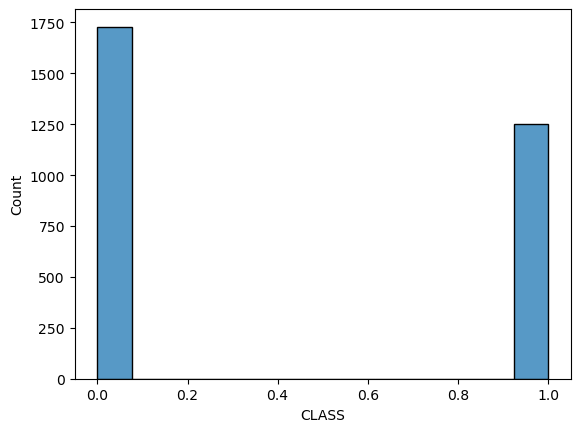

In [19]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn  as sns
sns.histplot(df['CLASS'])

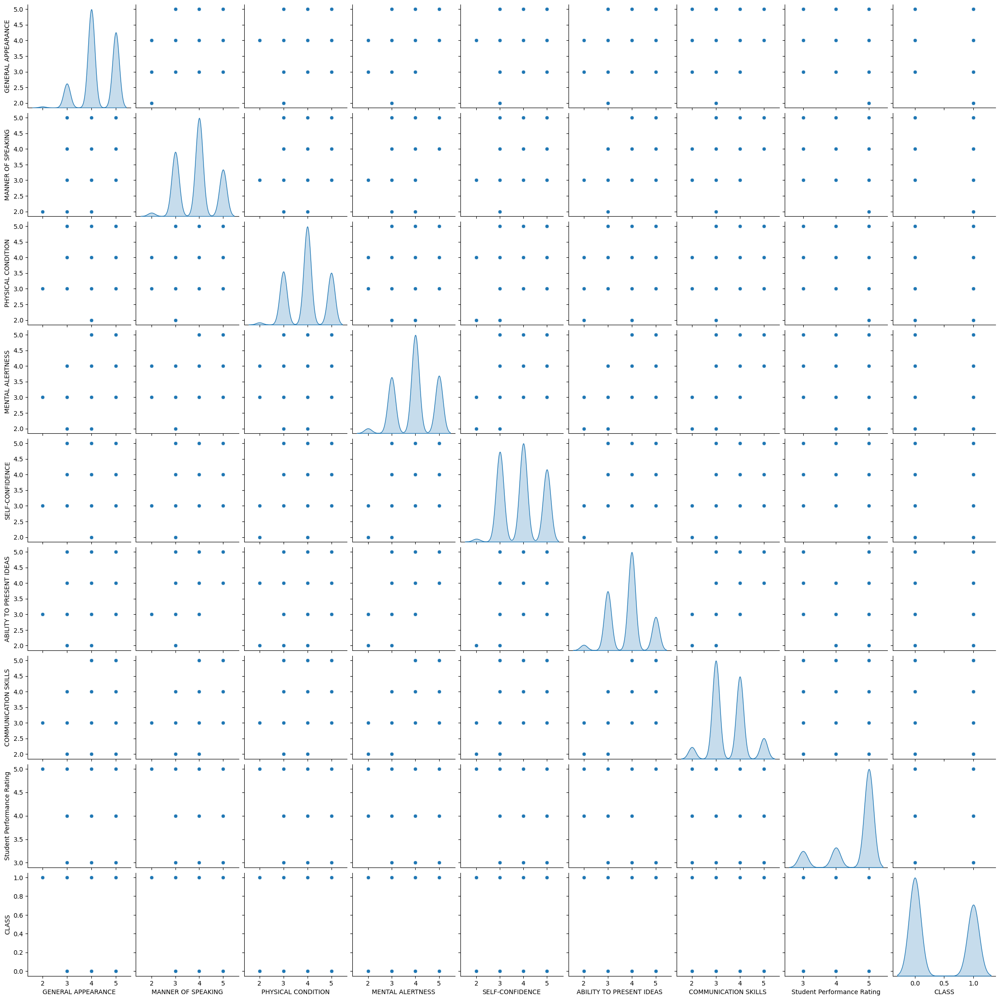

In [20]:
#Plot of features against each other
import seaborn as sns
sns.pairplot(df,diag_kind='kde')

In [21]:
#getting the correlation matrix of dataframe
df.corr()

,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating,CLASS
GENERAL APPEARANCE,1.000000,0.406823,0.468731,0.495937,0.480360,0.406541,0.371028,-0.087379,-0.116432
MANNER OF SPEAKING,0.406823,1.000000,0.551092,0.617226,0.549424,0.726366,0.622969,0.072317,-0.197887
PHYSICAL CONDITION,0.468731,0.551092,1.000000,0.634661,0.663473,0.570402,0.513667,0.041437,-0.164483
MENTAL ALERTNESS,0.495937,0.617226,0.634661,1.000000,0.675185,0.662191,0.630505,0.073547,-0.202781
SELF-CONFIDENCE,0.480360,0.549424,0.663473,0.675185,1.000000,0.587900,0.577251,-0.068683,-0.141549
ABILITY TO PRESENT IDEAS,0.406541,0.726366,0.570402,0.662191,0.587900,1.000000,0.647501,0.192467,-0.117447
COMMUNICATION SKILLS,0.371028,0.622969,0.513667,0.630505,0.577251,0.647501,1.000000,0.048223,-0.132850
Student Performance Rating,-0.087379,0.072317,0.041437,0.073547,-0.068683,0.192467,0.048223,1.000000,0.000822
CLASS,-0.116432,-0.197887,-0.164483,-0.202781,-0.141549,-0.117447,-0.132850,0.000822,1.000000


<Axes: >

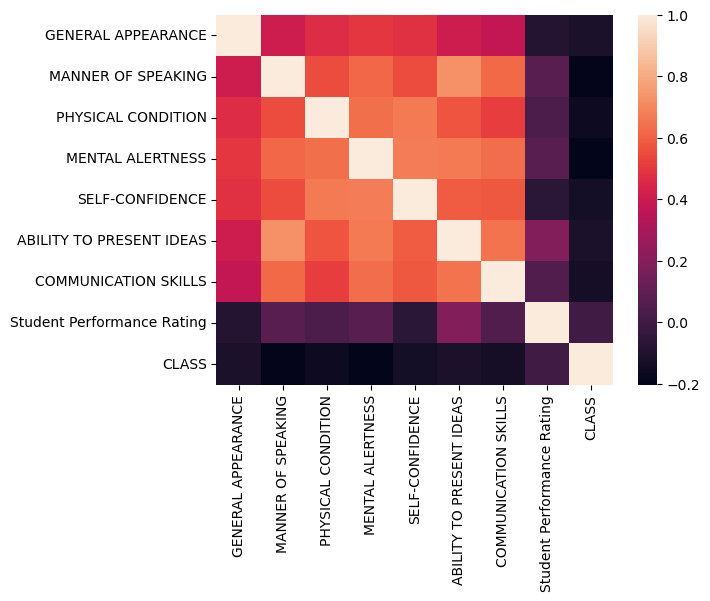

In [22]:
#representing the correlation in form of heat map
sns.heatmap(df.corr())

# Methodology

Support Vector Machine (SVM) is a supervised machine learning algorithm used for binary or multiclass classification. In binary classification, SVM finds the hyperplane that maximizes the margin between two classes. The vectors (points) that the margin lines touch are known as Support Vectors.

Kernels in SVM are functions used to transform the input data into the required form. They help in making complex boundaries using simple classifiers. I have used 4 different types of kernels for this experiment:

1. Linear Kernel: This is used when the data is linearly separable, that is, it can be separated using a single line. It’s one of the most common kernels to be used. It is represented by the inner product of the two input points.

2. Polynomial Kernel: This is a more generalized form of the linear kernel and can distinguish curved or nonlinear input space.

3. Sigmoid Kernel: This kernel uses the sigmoid function, commonly used in neural networks. The main advantage of using the sigmoid kernel is that it exists between (0 to 1). Therefore, it is especially used for models where we have to predict the probability as an output.

4. Gaussian RBF Kernel: This is a general-purpose kernel; used when there is no prior knowledge about the data. Effectively, the Gaussian kernel adds non-linear features to the feature space to help the algorithm make more complex decisions.

Parameters used:

1. C: This is the Regularization parameter. The strength of the regularization is inversely proportional to C. This helps to avoid overfitting.

2. Degree: This is the degree of the polynomial kernel function (‘poly’). Ignored by all other kernels.

3. Gamma: This defines how far the influence of a single training example reaches, with low values meaning ‘far’ and high values meaning ‘close’. If gamma is ‘scale’ (default) then it uses 1 / (n_features * X.var()) as value of gamma. If ‘auto’, uses 1/n_features.
4. Coef0: Independent term in kernel function. It is only significant in ‘poly’ and ‘sigmoid’.

In [155]:
X = df.drop(['CLASS'], axis=1)

y = df['CLASS']

In [156]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [157]:
# check the shape of X_train and X_test
X_train.shape, X_test.shape

((2385, 8), (597, 8))

### Feature scaling

In [26]:
import warnings
warnings.filterwarnings("ignore")
cols = X_train.columns

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [27]:
X_train = pd.DataFrame(X_train, columns=[cols])
X_test = pd.DataFrame(X_test, columns=[cols])
X_train.describe()

,GENERAL APPEARANCE,MANNER OF SPEAKING,PHYSICAL CONDITION,MENTAL ALERTNESS,SELF-CONFIDENCE,ABILITY TO PRESENT IDEAS,COMMUNICATION SKILLS,Student Performance Rating
count,2.385000e+03,2.385000e+03,2.385000e+03,2.385000e+03,2.385000e+03,2.385000e+03,2.385000e+03,2.385000e+03
mean,-1.578984e-16,-1.281062e-16,4.990185e-17,-1.638568e-17,2.562125e-16,2.763222e-16,-2.763222e-16,-2.018418e-16
std,1.000210e+00,1.000210e+00,1.000210e+00,1.000210e+00,1.000210e+00,1.000210e+00,1.000210e+00,1.000210e+00
min,-3.315173e+00,-2.512020e+00,-2.669246e+00,-2.500817e+00,-2.360233e+00,-2.474470e+00,-2.062857e+00,-2.354747e+00
25%,-3.649164e-01,-1.184484e+00,-1.315898e+00,-1.221442e+00,-1.123328e+00,-1.116841e+00,-7.078821e-01,-9.016884e-01
50%,-3.649164e-01,1.430510e-01,3.745116e-02,5.793400e-02,1.135774e-01,2.407869e-01,-7.078821e-01,5.513703e-01
75%,1.110212e+00,1.430510e-01,3.745116e-02,1.337310e+00,1.350483e+00,2.407869e-01,6.470929e-01,5.513703e-01
max,1.110212e+00,1.470586e+00,1.390800e+00,1.337310e+00,1.350483e+00,1.598415e+00,2.002068e+00,5.513703e-01


In [28]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
svc=SVC() # instantiate classifier with default hyperparameters
svc.fit(X_train,y_train) # fit classifier to training set
y_pred=svc.predict(X_test)  # make predictions on test set
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with default hyperparameters: 0.8744


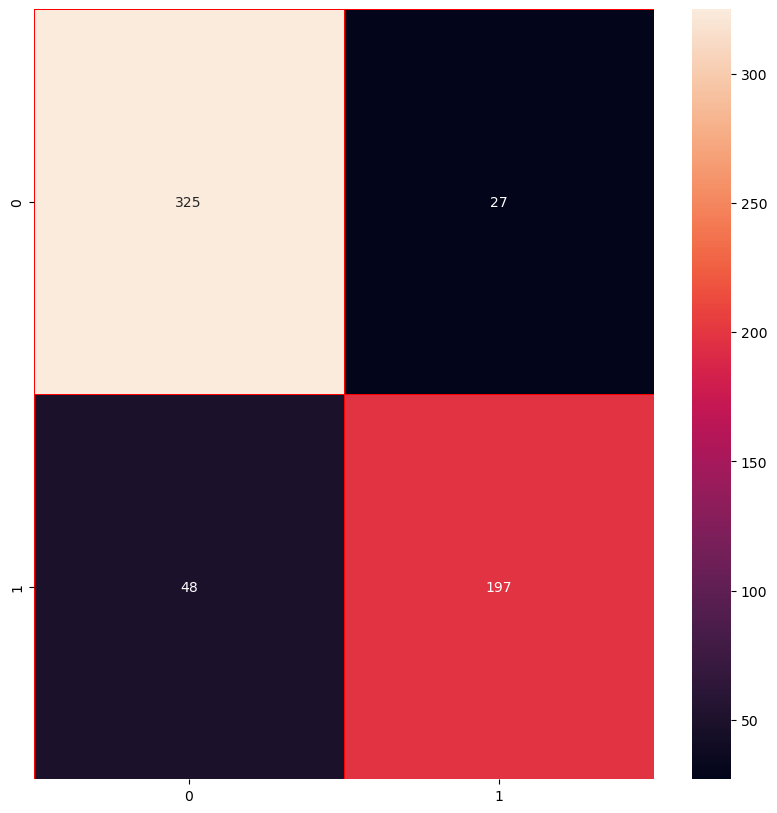

<Figure size 640x480 with 0 Axes>

In [29]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

In [30]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.87      0.92      0.90       352
           1       0.88      0.80      0.84       245

    accuracy                           0.87       597
   macro avg       0.88      0.86      0.87       597
weighted avg       0.87      0.87      0.87       597



## Linear kernel
### Model 1: C = 1

In [87]:
# instantiate classifier with linear kernel and C=1.0
linear_svc=SVC(kernel='linear', C=1.0) 
linear_svc.fit(X_train,y_train) # fit classifier to training set
y_pred=linear_svc.predict(X_test)
print('Model accuracy score with linear kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with linear kernel and C=1.0 : 0.5896


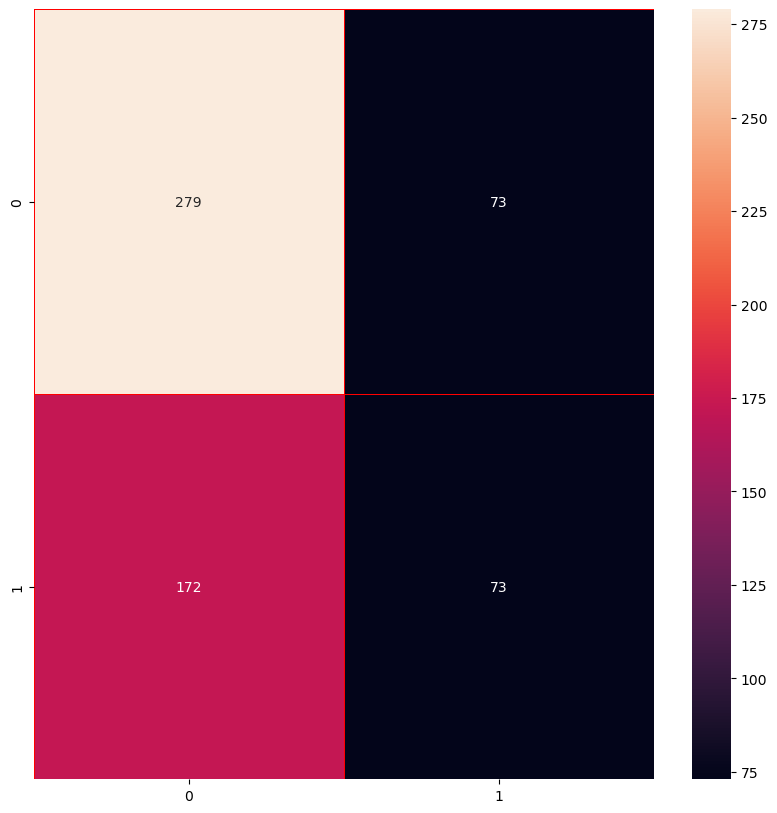

<Figure size 640x480 with 0 Axes>

In [88]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_test)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “73” indicates that there were 73 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “279” shows that there were 279 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “73” shows that there were 73 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “172” indicates that there were 172 instances where class 1 was incorrectly predicted as class 0.

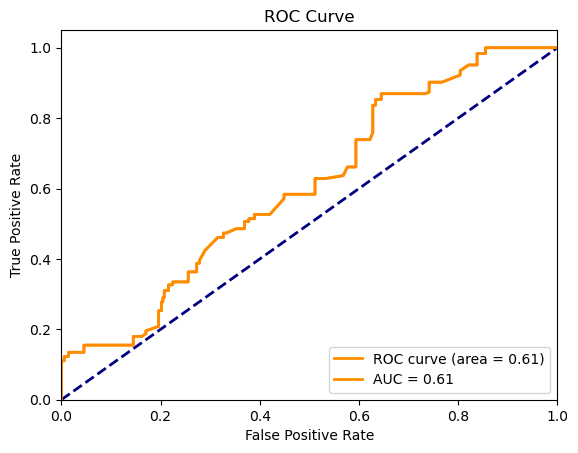

In [89]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = linear_svc.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

This is a Receiver Operating Characteristic (ROC) curve. It’s a plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The curve is created by plotting the True Positive Rate (TPR) against the False Positive Rate (FPR) at various threshold settings.

In this specific ROC curve, the Area Under the Curve (AUC) is 0.61. The AUC provides an aggregate measure of performance across all possible classification thresholds. An AUC of 1 represents a perfect classifier, while an AUC of 0.5 represents a worthless classifier. An AUC of 0.61 suggests that the classifier has a moderate predictive accuracy.

In [91]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy1 = accuracy_score(y_test, y_pred)
precision1 = precision_score(y_test, y_pred)
recall1 = recall_score(y_test, y_pred)
f11 = f1_score(y_test, y_pred)

# Print metrics
print('Model performance metrics with linear kernel and C=1.0:')
print('Accuracy: {0:0.4f}'.format(accuracy1))
print('Precision: {0:0.4f}'.format(precision1))
print('Recall: {0:0.4f}'.format(recall1))
print('F1 Score: {0:0.4f}'.format(f11))

Model performance metrics with linear kernel and C=1.0:
Accuracy: 0.5896
Precision: 0.5000
Recall: 0.2980
F1 Score: 0.3734


The model's accuracy of 0.5896 means it makes correct predictions about 59% of the time. Its precision of 0.5000 indicates that when it predicts the positive class, it's correct 50% of the time. The recall of 0.2980 shows that it identifies 29.8% of all actual positive instances. The F1 score of 0.3734, being the balance between precision and recall, suggests that these two are not well balanced.

### Model 2: C = 100

In [109]:
# instantiate classifier with linear kernel and C=100.0
linear_svc100=SVC(kernel='linear', C=100.0) 
linear_svc100.fit(X_train, y_train)
y_pred=linear_svc100.predict(X_test)
print('Model accuracy score with linear kernel and C=100.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with linear kernel and C=100.0 : 0.5879


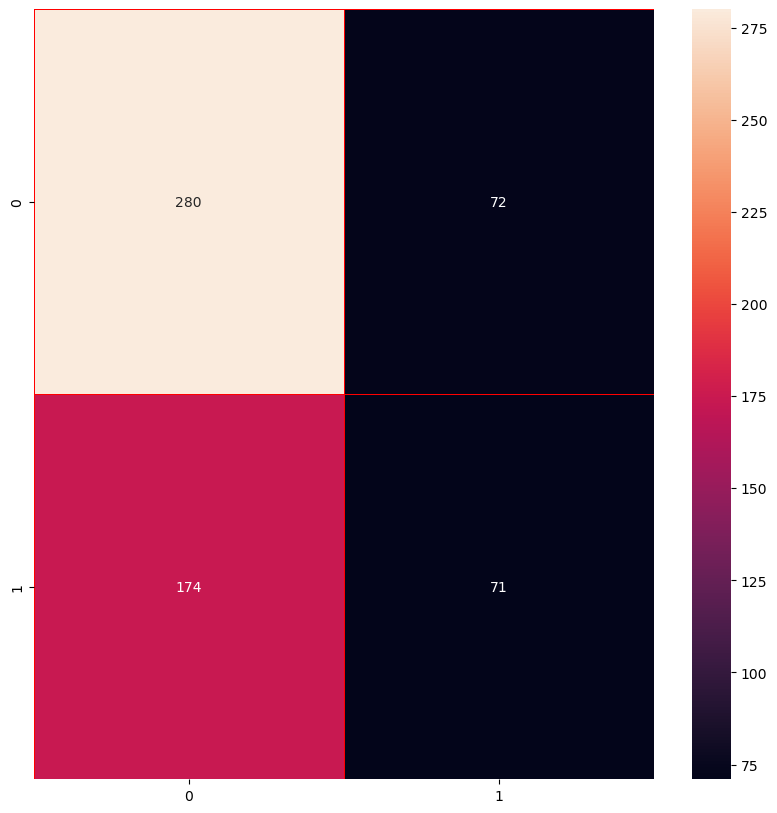

<Figure size 640x480 with 0 Axes>

In [110]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “71” indicates that there were 71 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “280” shows that there were 280 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “72” shows that there were 72 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “174” indicates that there were 174 instances where class 1 was incorrectly predicted as class 0.

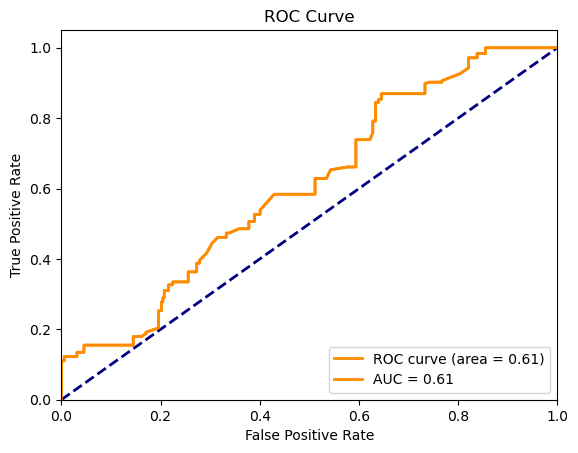

In [111]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = linear_svc100.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

An AUC of 0.61 suggests that the classifier has a moderate predictive accuracy.

In [112]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy2 = accuracy_score(y_test, y_pred)
precision2 = precision_score(y_test, y_pred)
recall2 = recall_score(y_test, y_pred)
f12 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy2))
print('Precision: {0:0.4f}'.format(precision2))
print('Recall: {0:0.4f}'.format(recall2))
print('F1 Score: {0:0.4f}'.format(f12))

Accuracy: 0.5879
Precision: 0.4965
Recall: 0.2898
F1 Score: 0.3660


The model’s accuracy of 0.5879 suggests it makes correct predictions about 59% of the time. Its precision of 0.4965 indicates that when it predicts the positive class, it’s correct around 50% of the time. The recall of 0.2898 shows that it identifies approximately 29% of all actual positive instances. The F1 score of 0.3660 suggests a need for better balance between precision and recall.

## Polynomial kernel
### Model 3: degree = 3, c = 1

In [113]:
# instantiate classifier with polynomial kernel, C=1.0, and degree=3
poly_svc = SVC(kernel='poly', C=1.0, degree=3)
poly_svc.fit(X_train, y_train)
y_pred = poly_svc.predict(X_test)
print('Model accuracy score with polynomial kernel, C=1.0, and degree=3 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with polynomial kernel, C=1.0, and degree=3 : 0.8141


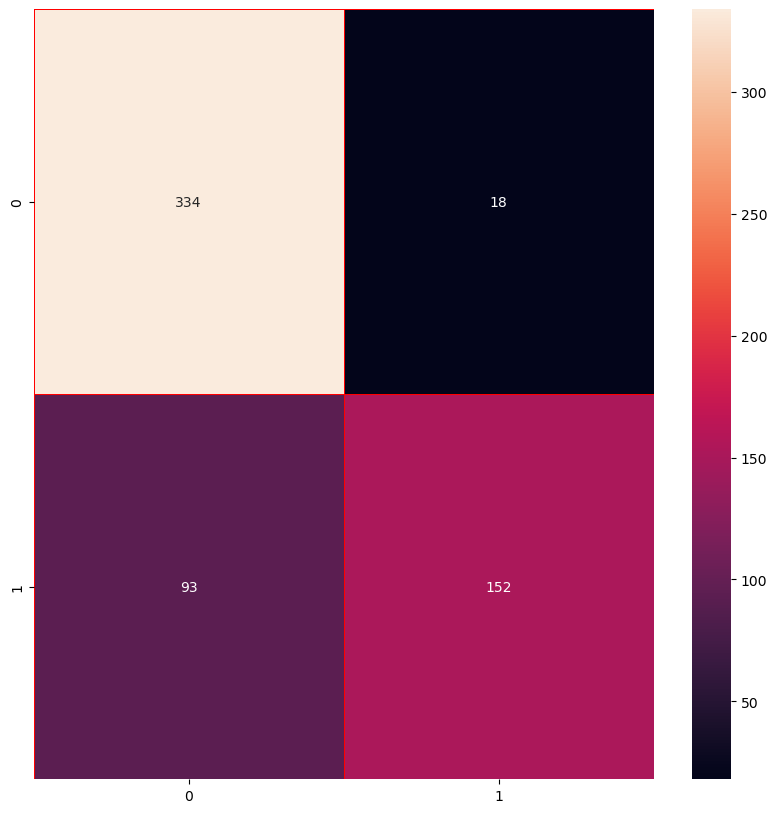

<Figure size 640x480 with 0 Axes>

In [114]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “152” indicates that there were 152 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “334” shows that there were 334 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “18” shows that there were 18 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “93” indicates that there were 93 instances where class 1 was incorrectly predicted as class 0.

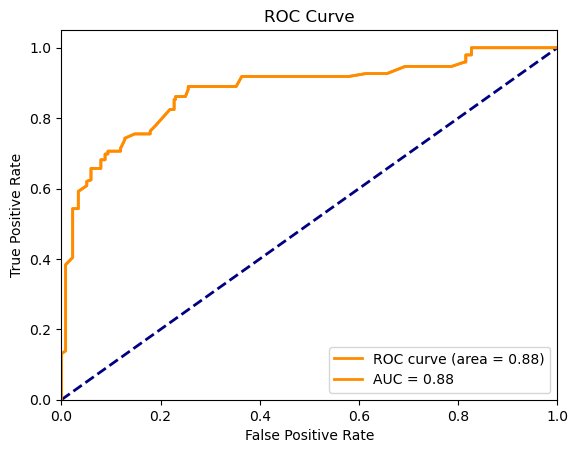

In [115]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = poly_svc.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

False Positive Rate (FPR): This is on the X-axis and represents the ratio of negative instances that are incorrectly classified as positive. It’s equal to 1 minus the True Negative Rate.

True Positive Rate (TPR): This is on the Y-axis and represents the ratio of positive instances that are correctly classified as positive.

ROC Curve: The orange line represents the ROC curve, which shows the trade-off between the TPR and FPR for different threshold values. The closer this curve is to the top left corner, the better the model’s performance.

Area Under the Curve (AUC): The area under the ROC curve is 0.88, as indicated in the image. The AUC ranges from 0 to 1, where an AUC of 1 means the model has perfect classification performance, and an AUC of 0.5 means the model performs no better than random chance. An AUC of 0.88 indicates a good performing model.

Diagonal Line: The blue dashed line represents a random classifier (AUC = 0.5). Any useful classifier should perform significantly better than this.

In [116]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy3 = accuracy_score(y_test, y_pred)
precision3 = precision_score(y_test, y_pred)
recall3 = recall_score(y_test, y_pred)
f13 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy3))
print('Precision: {0:0.4f}'.format(precision3))
print('Recall: {0:0.4f}'.format(recall3))
print('F1 Score: {0:0.4f}'.format(f13))

Accuracy: 0.8141
Precision: 0.8941
Recall: 0.6204
F1 Score: 0.7325


The model’s accuracy of 0.8141 suggests it makes correct predictions about 81% of the time. Its precision of 0.8941 indicates that when it predicts the positive class, it’s correct around 89% of the time. The recall of 0.6204 shows that it identifies approximately 62% of all actual positive instances. The F1 score of 0.7325 suggests a reasonable balance between precision and recall. Overall, this model shows good performance

### Model 4 : degree = 4, c = 100

In [117]:
# instantiate classifier with polynomial kernel and C=100.0
poly_svc100 = SVC(kernel='poly', C=100.0, degree=4)
poly_svc100.fit(X_train, y_train)
y_pred=poly_svc100.predict(X_test)
print('Model accuracy score with polynomial kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with polynomial kernel and C=1.0 : 0.9012


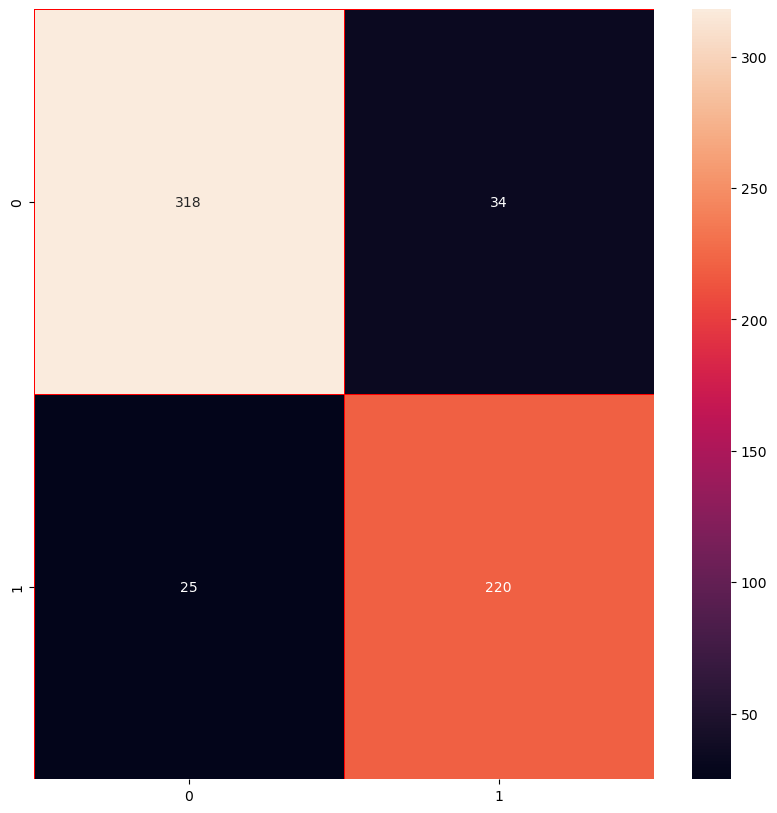

<Figure size 640x480 with 0 Axes>

In [118]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “220” indicates that there were 220 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “318” shows that there were 318 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “34” shows that there were 34 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “25” indicates that there were 25 instances where class 1 was incorrectly predicted as class 0.

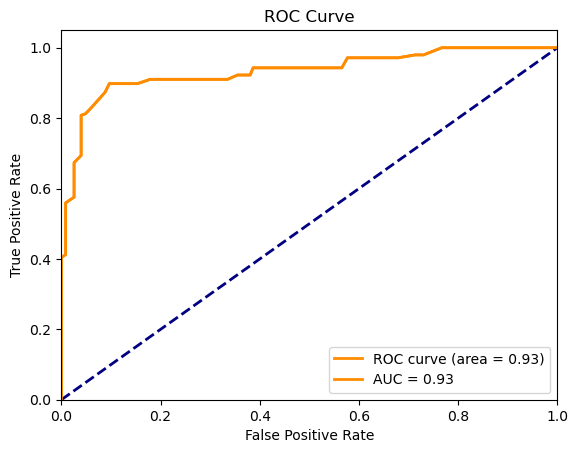

In [119]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = poly_svc100.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

The curve is close to the top left corner, indicating a high true positive rate and a low false positive rate. The area under the curve (AUC) is 0.93, which is quite high, suggesting that the model has good predictive performance. The blue dashed line represents a random classifier for comparison.

In [120]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy4 = accuracy_score(y_test, y_pred)
precision4 = precision_score(y_test, y_pred)
recall4 = recall_score(y_test, y_pred)
f14 = f1_score(y_test, y_pred)

# Print metrics
print('Accuracy: {0:0.4f}'.format(accuracy4))
print('Precision: {0:0.4f}'.format(precision4))
print('Recall: {0:0.4f}'.format(recall4))
print('F1 Score: {0:0.4f}'.format(f14))

Accuracy: 0.9012
Precision: 0.8661
Recall: 0.8980
F1 Score: 0.8818


The model’s accuracy of 0.9012 suggests it makes correct predictions about 90% of the time. Its precision of 0.8661 indicates that when it predicts the positive class, it’s correct around 87% of the time. The recall of 0.8980 shows that it identifies approximately 90% of all actual positive instances. The F1 score of 0.8818 suggests a good balance between precision and recall. Overall, this model shows excellent performance.

## Sigmoid kernel
### Model 5: C=1, gamma = 0.1, coef0 = 0

In [121]:
# instantiate classifier with sigmoid kernel, C=1.0, gamma=0.1, and coef0=0.0
sigmoid_svc = SVC(kernel='sigmoid', C=1.0, gamma=0.1, coef0=0.0)
sigmoid_svc.fit(X_train, y_train)
y_pred = sigmoid_svc.predict(X_test)
print('Model accuracy score with sigmoid kernel, C=1.0, gamma=0.1, and coef0=0.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with sigmoid kernel, C=1.0, gamma=0.1, and coef0=0.0 : 0.5260


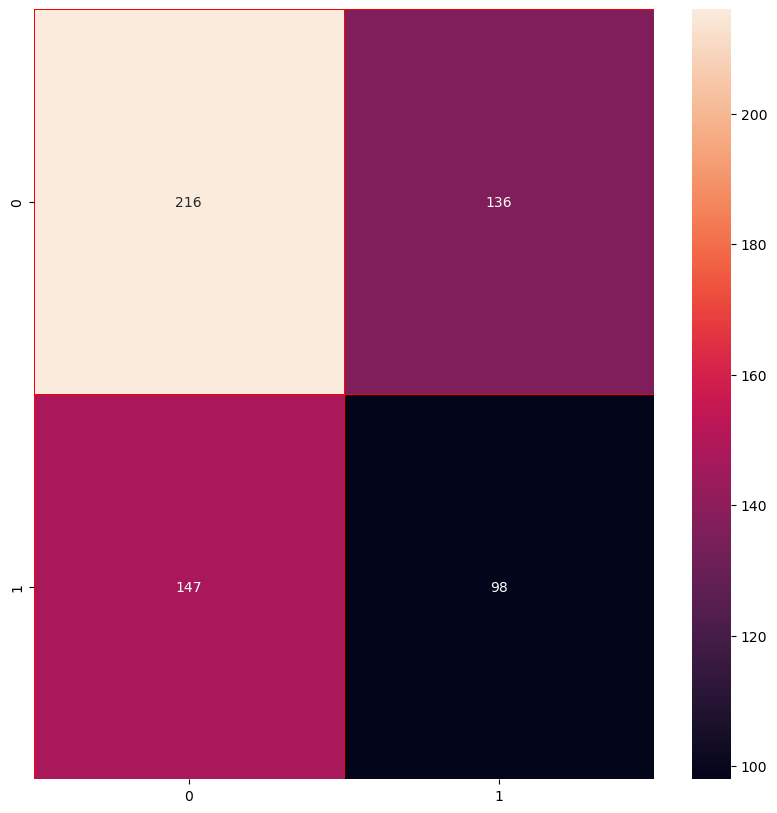

<Figure size 640x480 with 0 Axes>

In [122]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “98” indicates that there were 98 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “216” shows that there were 216 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “136” shows that there were 136 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “147” indicates that there were 147 instances where class 1 was incorrectly predicted as class 0.

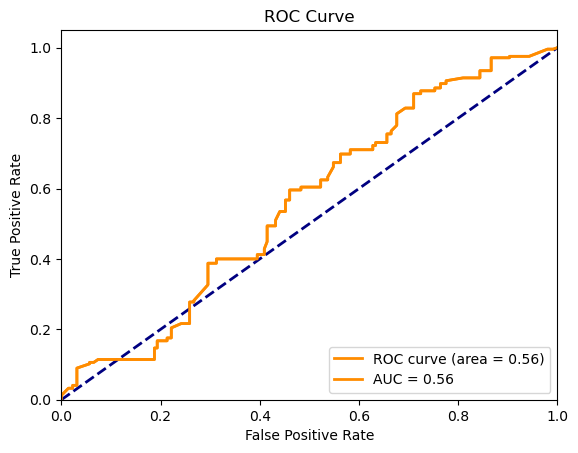

In [123]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = sigmoid_svc.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

The area under the curve (AUC) is 0.56, which is closer to 0.5, indicating that the model’s performance is not much better than random guessing. The blue dashed line represents a random classifier for comparison. 

In [124]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy5 = accuracy_score(y_test, y_pred)
precision5 = precision_score(y_test, y_pred)
recall5 = recall_score(y_test, y_pred)
f15 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy5))
print('Precision: {0:0.4f}'.format(precision5))
print('Recall: {0:0.4f}'.format(recall5))
print('F1 Score: {0:0.4f}'.format(f15))

Accuracy: 0.5260
Precision: 0.4188
Recall: 0.4000
F1 Score: 0.4092


The model’s accuracy of 0.5260 suggests it makes correct predictions about 53% of the time. Its precision of 0.4188 indicates that when it predicts the positive class, it’s correct around 42% of the time. The recall of 0.4000 shows that it identifies approximately 40% of all actual positive instances. The F1 score of 0.4092 suggests a balance between precision and recall could be improved. Overall, the model’s performance appears to be below average.

### Model 6: C=100, gamma = 0.5, coef0 = 0.3

In [125]:
sigmoid_svc100=SVC(kernel='sigmoid', C=100.0, gamma=0.5, coef0=0.1)
sigmoid_svc100.fit(X_train,y_train)
y_pred=sigmoid_svc100.predict(X_test)
print('Model accuracy score with sigmoid kernel and C=100.0 gamma=0.5, coef0=0.1 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with sigmoid kernel and C=100.0 gamma=0.5, coef0=0.1 : 0.5662


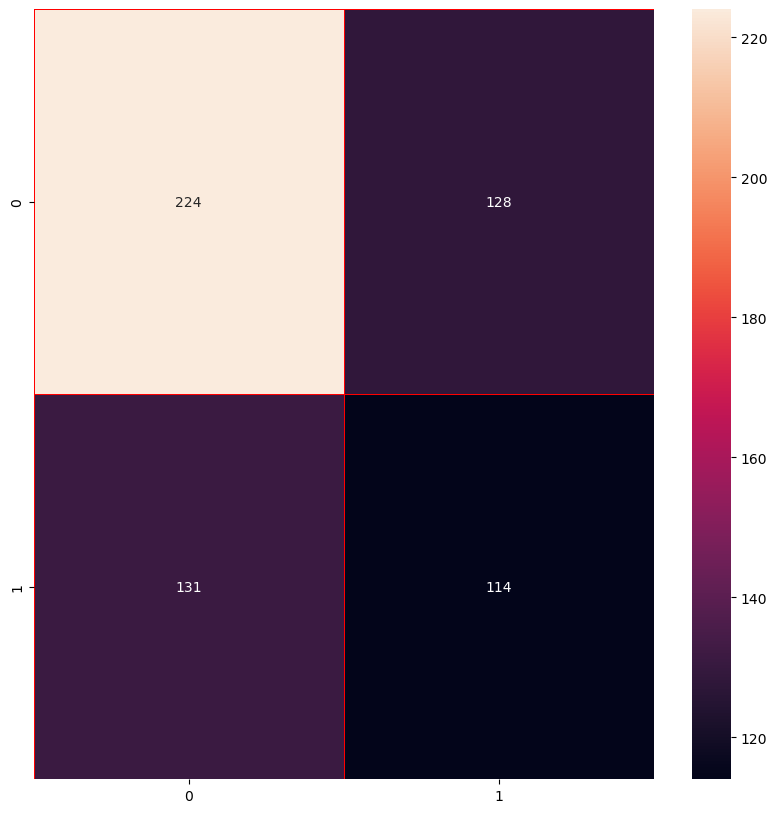

<Figure size 640x480 with 0 Axes>

In [126]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “114” indicates that there were 114 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “224” shows that there were 224 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “128” shows that there were 128 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “131” indicates that there were 131 instances where class 1 was incorrectly predicted as class 0.

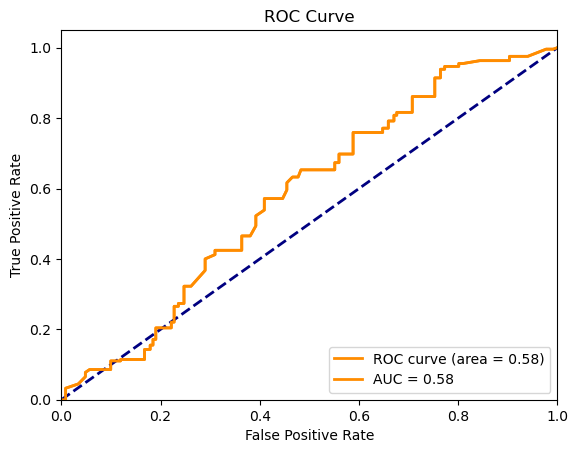

In [127]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = sigmoid_svc100.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

The area under the curve (AUC) is 0.58, which is closer to 0.5, indicating that the model’s performance is not much better than random guessing. The blue dashed line represents a random classifier for comparison

In [128]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy6 = accuracy_score(y_test, y_pred)
precision6 = precision_score(y_test, y_pred)
recall6 = recall_score(y_test, y_pred)
f16 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy6))
print('Precision: {0:0.4f}'.format(precision6))
print('Recall: {0:0.4f}'.format(recall6))
print('F1 Score: {0:0.4f}'.format(f16))

Accuracy: 0.5662
Precision: 0.4711
Recall: 0.4653
F1 Score: 0.4682


The model’s accuracy of 0.5662 suggests it makes correct predictions about 57% of the time. Its precision of 0.4711 indicates that when it predicts the positive class, it’s correct around 47% of the time. The recall of 0.4653 shows that it identifies approximately 47% of all actual positive instances. The F1 score of 0.4682 suggests a balance between precision and recall could be improved. Overall, the model’s performance appears to be below average. 

## Gaussian RBF kernel
### Model 7: C=1.0, and gamma=0.1

In [129]:
# instantiate classifier with RBF kernel, C=1.0, and gamma=0.1
rbf_svc = SVC(kernel='rbf', C=1.0, gamma=0.1)
rbf_svc.fit(X_train, y_train)
y_pred = rbf_svc.predict(X_test)
print('Model accuracy score with RBF kernel, C=1.0, and gamma=0.1 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with RBF kernel, C=1.0, and gamma=0.1 : 0.8626


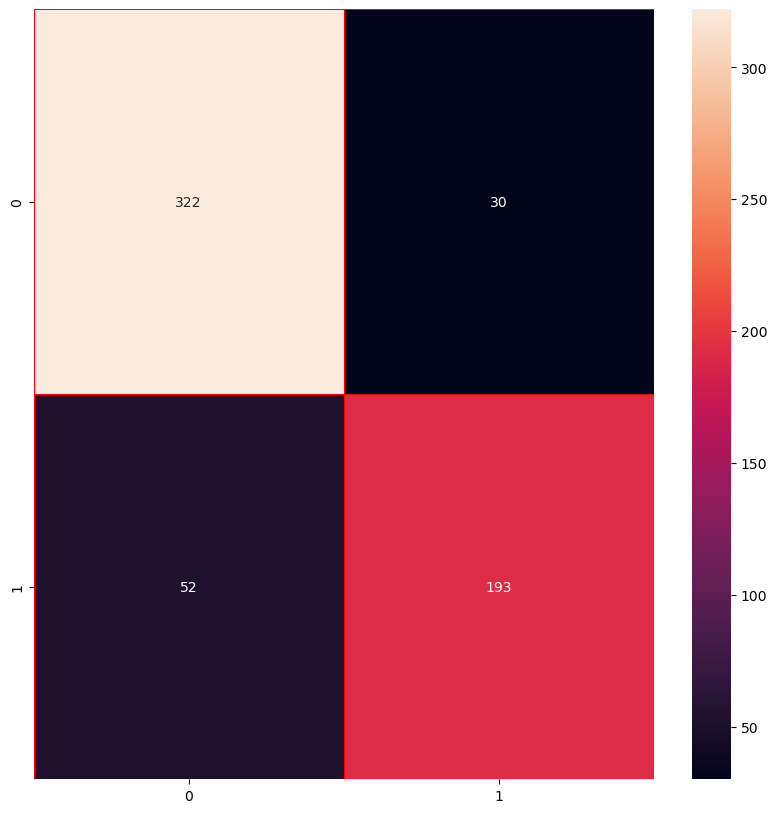

<Figure size 640x480 with 0 Axes>

In [130]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “193” indicates that there were 193 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “322” shows that there were 322 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “30” shows that there were 30 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “52” indicates that there were 52 instances where class 1 was incorrectly predicted as class 0.

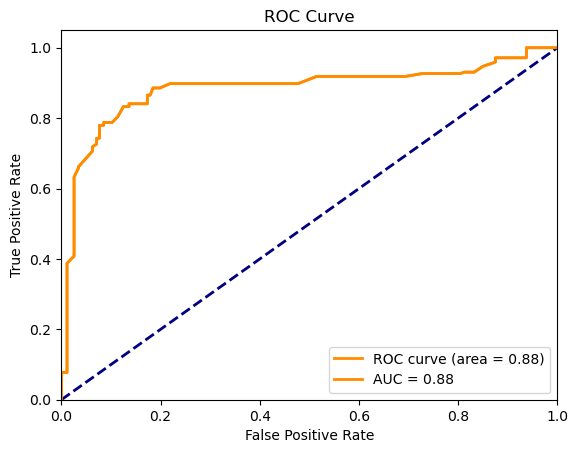

In [131]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = rbf_svc.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

The curve is close to the top left corner, indicating a high true positive rate and a low false positive rate. The area under the curve (AUC) is 0.88, which is quite high, suggesting that the model has good predictive performance. The blue dashed line represents a random classifier for comparison.

In [132]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy7 = accuracy_score(y_test, y_pred)
precision7 = precision_score(y_test, y_pred)
recall7 = recall_score(y_test, y_pred)
f17 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy7))
print('Precision: {0:0.4f}'.format(precision7))
print('Recall: {0:0.4f}'.format(recall7))
print('F1 Score: {0:0.4f}'.format(f17))

Accuracy: 0.8626
Precision: 0.8655
Recall: 0.7878
F1 Score: 0.8248


The model’s accuracy of 0.8626 suggests it makes correct predictions about 86% of the time. Its precision of 0.8655 indicates that when it predicts the positive class, it’s correct around 87% of the time. The recall of 0.7878 shows that it identifies approximately 79% of all actual positive instances. The F1 score of 0.8248 suggests a good balance between precision and recall. Overall, this model shows good performance.

### Model 8: C=300.0, and gamma=0.5

In [139]:
# instantiate classifier with RBF kernel, C=300.0, and gamma=0.5
rbf_svc100 = SVC(kernel='rbf', C=300.0, gamma=0.5)
rbf_svc100.fit(X_train, y_train)
y_pred = rbf_svc100.predict(X_test)
print('Model accuracy score with RBF kernel, C=300.0, and gamma=0.5 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with RBF kernel, C=300.0, and gamma=0.5 : 0.9012


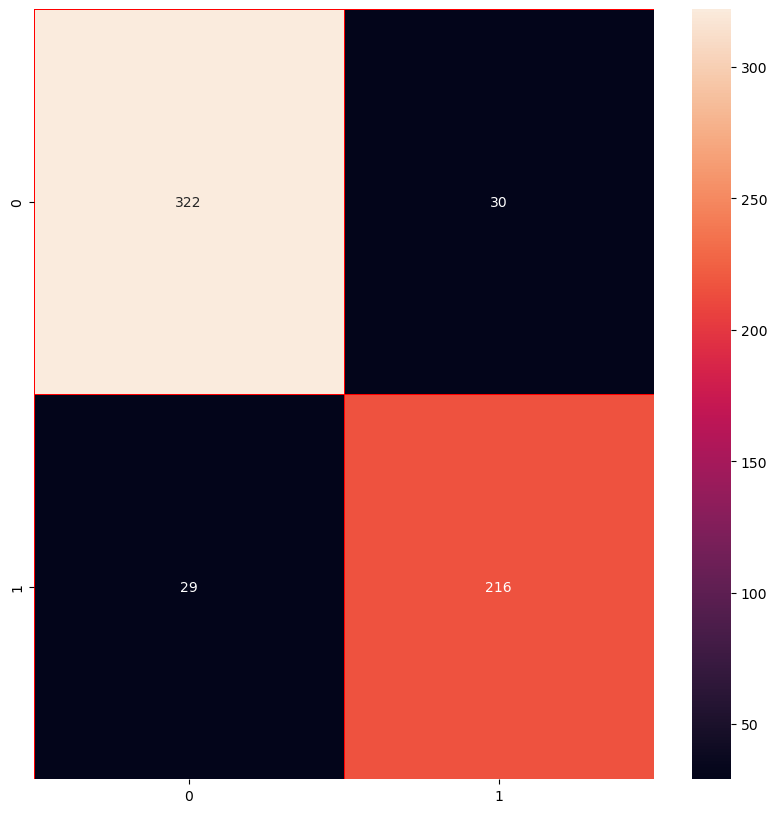

<Figure size 640x480 with 0 Axes>

In [140]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

True Positives (TP): The bottom right cell with “216” indicates that there were 216 instances where class 1 was correctly predicted as class 1.

True Negatives (TN): The top left cell with “322” shows that there were 322 instances where class 0 was correctly predicted as class 0.

False Positives (FP): The top right cell with “30” shows that there were 30 instances where class 0 was incorrectly predicted as class 1.

False Negatives (FN): The bottom left cell with “29” indicates that there were 29 instances where class 1 was incorrectly predicted as class 0.

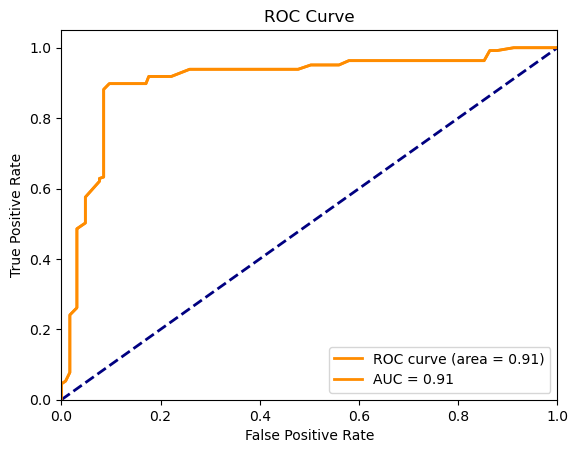

In [141]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_score = rbf_svc100.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

The curve is close to the top left corner, indicating a high true positive rate and a low false positive rate. The area under the curve (AUC) is 0.91, which is quite high, suggesting that the model has good predictive performance. The blue dashed line represents a random classifier for comparison.

In [142]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy8= accuracy_score(y_test, y_pred)
precision8 = precision_score(y_test, y_pred)
recall8 = recall_score(y_test, y_pred)
f18 = f1_score(y_test, y_pred)

print('Accuracy: {0:0.4f}'.format(accuracy8))
print('Precision: {0:0.4f}'.format(precision8))
print('Recall: {0:0.4f}'.format(recall8))
print('F1 Score: {0:0.4f}'.format(f18))

Accuracy: 0.9012
Precision: 0.8780
Recall: 0.8816
F1 Score: 0.8798


The model’s accuracy of 0.9012 suggests it makes correct predictions about 90% of the time. Its precision of 0.8780 indicates that when it predicts the positive class, it’s correct around 88% of the time. The recall of 0.8816 shows that it identifies approximately 88% of all actual positive instances. The F1 score of 0.8798 suggests a good balance between precision and recall. Overall, this model shows excellent performance. 

# Multiclass

# Dataset Description

Seven different types of dry beans were used in this dataset, taking into account the features such as form, shape, type, and structure.

__Independent Variables__
1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.

2.) Perimeter (P): Bean circumference is defined as the length of its border.

3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.

4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.

5.) Aspect ratio (K): Defines the relationship between L and l.

6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.

7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.

8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.

9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.

10.)Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.

11.)Roundness (R): Calculated with the following formula: (4piA)/(P^2)

12.)Compactness (CO): Measures the roundness of an object: Ed/L

13.)ShapeFactor1 (SF1)

14.)ShapeFactor2 (SF2)

15.)ShapeFactor3 (SF3)

16.)ShapeFactor4 (SF4)

__Dependent Variables__

17.)Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)


# Exploratoty Analysis and Pre-Processing

In [1]:
import pandas as pd
df=pd.read_excel("Dry_Bean_Dataset.xlsx") #importing and saving dataset
df.head(20) #showing starting 20 rows

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [2]:
df.shape #get the shape of dataframe created

(13611, 17)

In [3]:
df.isna().sum() #check the number of missing values in each column

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [4]:
df.dtypes #check the data types of each column in dataframe

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object

In [5]:
for col in df.columns: #Checking the unique values of the Dependent variable
    if df[col].dtype=='object':
        print(col)
        print(df[col].unique())

Class
['SEKER' 'BARBUNYA' 'BOMBAY' 'CALI' 'HOROZ' 'SIRA' 'DERMASON']


In [6]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
df['Class'] = enc.fit_transform(df['Class'] ) 
df.head() #Converting class labels to numerical

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,5
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,5


In [7]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063,3.532657
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366,1.828709
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687,0.000000
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703,2.000000
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386,3.000000
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883,5.000000
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733,6.000000


<Axes: xlabel='Class', ylabel='Count'>

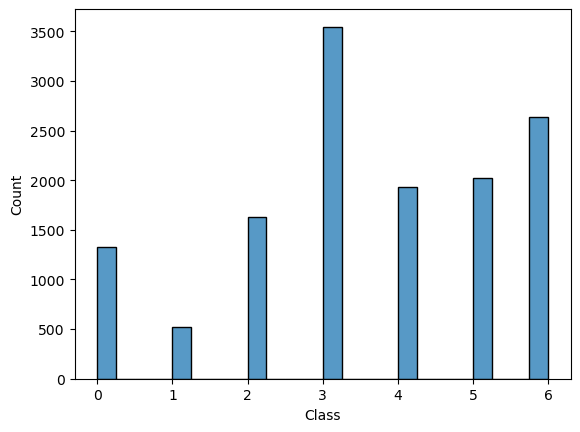

In [15]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn  as sns
sns.histplot(df['Class']) #Show count of diff classes

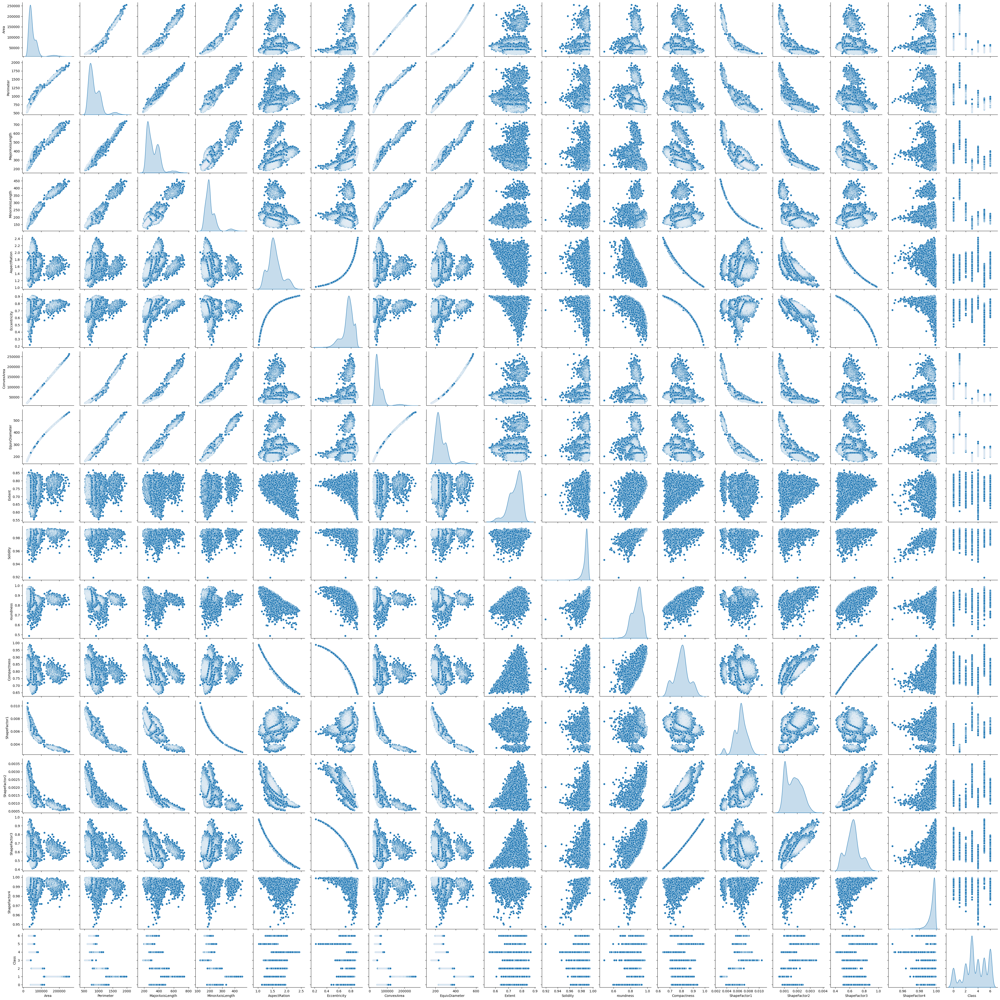

In [9]:
#Plot of features against each other
import seaborn as sns
sns.pairplot(df,diag_kind='kde')

In [16]:
#getting the correlation matrix of dataframe
df.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
Area,1.000000,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721,-0.475252
Perimeter,0.966722,1.000000,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310,-0.507638
MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527,-0.455175
MinorAxisLength,0.951602,0.913179,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749,-0.458492
AspectRation,0.241735,0.385276,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264,-0.116332
Eccentricity,0.267481,0.391066,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354,-0.200356
ConvexArea,0.999939,0.967689,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049,-0.477459
EquivDiameter,0.984968,0.991380,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512,-0.481099
Extent,0.054345,-0.021160,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502,-0.031184
Solidity,-0.196585,-0.303970,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163,0.321283


<Axes: >

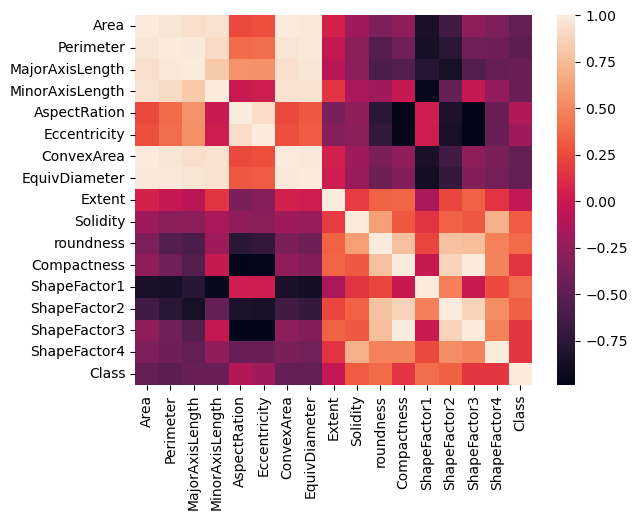

In [17]:
#representing the correlation in form of heat map
sns.heatmap(df.corr())

# Methodology

Support Vector Machine (SVM) is a supervised machine learning algorithm used for classification and regression tasks. In the context of classification, SVM aims to find the hyperplane that best separates different classes in the feature space.

To use SVM in multi-class classification, there are two common approaches:

One-vs-One (OvO): In this approach, a binary classifier is trained for each pair of classes. For example, if there are N classes, N*(N-1)/2 classifiers are trained. During prediction, each classifier votes for a class, and the class with the most votes is chosen as the final prediction.

One-vs-All (OvA) or One-vs-Rest (OvR): In this approach, a single classifier is trained for each class, treating that class as the positive class and all other classes as the negative class. During prediction, the class with the highest confidence score from all classifiers is chosen as the final prediction.

The theoretical methodology for using SVM in multi-class classification involves the following steps:

Data Preparation: Prepare  dataset with features and corresponding labels for multi-class classification.

Feature Scaling: Normalize or standardize  features to ensure that all features contribute equally to the model.

Model Training: Train an SVM model using one of the multi-class strategies mentioned above (OvO or OvA).

Hyperparameter Tuning: Tuning the hyperparameters of the SVM model, such as the regularization parameter (C) and kernel parameters, using techniques like grid search or cross-validation.

Model Evaluation: Evaluate the performance of the SVM model using metrics like accuracy, precision, recall, F1-score, and confusion matrix on a separate validation set.

Prediction: Use the trained SVM model to make predictions on new data points for multi-class classification.

By following these steps and choosing the appropriate multi-class strategy, we can effectively use SVM for multi-class classification tasks.

SVM can utilize different types of kernels to map data into higher-dimensional spaces, allowing for more complex decision boundaries. Some common kernels used in SVM are:

1. Linear Kernel: This kernel is used for linearly separable data and is computationally efficient.

2. Polynomial Kernel: . This kernel introduces non-linearity through the polynomial function of degree d and a constant term c.

3. Radial Basis Function (RBF) or Gaussian Kernel: The RBF kernel is widely used for non-linear data and has two hyperparameters: C (regularization parameter) and gamma (kernel coefficient).

4. Sigmoid Kernel: This kernel is based on the hyperbolic tangent function and can be used for non-linear problems.

Parameters in SVM include:

1. Regularization Parameter C: It controls the trade-off between achieving a low training error and a low model complexity to avoid overfitting. A higher C value allows the model to fit the training data more closely, potentially leading to overfitting.

2. Kernel Parameters:
   - Degree d: Relevant for polynomial kernels, it determines the degree of the polynomial.
   - Gamma : Relevant for RBF kernels, it defines how far the influence of a single training example reaches.

3. Coefficient c: Relevant for polynomial and sigmoid kernels, it is a constant added to the dot product of two vectors.

When using SVM, selecting the appropriate kernel and tuning the hyperparameters through techniques like grid search or cross-validation is crucial for achieving optimal performance.

In [8]:
# Dropping the dependent variable from dataset and storing both of them in x,y variables
X = df.drop(['Class'], axis=1)
y = df['Class']

In [9]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [10]:
# check the shape of X_train and X_test
X_train.shape, X_test.shape

((10888, 16), (2723, 16))

# Feature Scaling

To prevent features with larger scales from disproportionately influencing the model's learning process, ensuring that all features contribute equally by bringing them to a standardized scale ie __normalisation__.

In [11]:
import warnings
warnings.filterwarnings("ignore")
cols = X_train.columns

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [12]:
X_train = pd.DataFrame(X_train, columns=[cols])
X_test = pd.DataFrame(X_test, columns=[cols])
X_train.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04,1.088800e+04
mean,7.309036e-17,6.421510e-16,8.646851e-17,2.378700e-16,-9.788888e-17,1.605378e-16,3.295592e-17,4.137437e-16,-1.106144e-15,-1.735472e-14,-2.359122e-16,-9.857410e-16,3.775248e-16,2.936666e-18,-3.034555e-17,1.797860e-14
std,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00
min,-1.108464e+00,-1.537888e+00,-1.588483e+00,-1.767092e+00,-2.185867e+00,-5.095677e+00,-1.106995e+00,-1.546473e+00,-3.959327e+00,-1.447874e+01,-6.424323e+00,-2.579979e+00,-3.339090e+00,-1.930810e+00,-2.355665e+00,-1.089104e+01
25%,-5.662045e-01,-7.029161e-01,-7.769597e-01,-5.864708e-01,-6.141245e-01,-3.841083e-01,-5.688928e-01,-6.364433e-01,-6.359877e-01,-3.142386e-01,-6.915995e-01,-6.048032e-01,-5.927584e-01,-9.454295e-01,-6.277946e-01,-3.021491e-01
50%,-2.888237e-01,-2.847667e-01,-2.775589e-01,-2.215101e-01,-1.328008e-01,1.454887e-01,-2.915493e-01,-2.501296e-01,2.089049e-01,2.407831e-01,1.663905e-01,2.452590e-02,7.596964e-02,-3.025417e-02,-1.406573e-02,3.017208e-01
75%,2.766899e-01,5.637362e-01,6.550990e-01,3.244992e-01,5.028199e-01,6.498966e-01,2.802969e-01,4.399867e-01,7.561189e-01,6.157492e-01,7.324288e-01,5.575434e-01,6.279832e-01,7.641078e-01,5.296261e-01,6.419519e-01
max,6.810045e+00,5.237342e+00,4.858455e+00,5.686473e+00,3.430304e+00,1.746884e+00,6.971435e+00,5.305118e+00,2.365541e+00,1.603150e+00,1.964506e+00,2.898708e+00,3.442401e+00,3.264918e+00,3.177113e+00,1.062373e+00


# Linear Kernel



# C=1

In [13]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc,precision_score, recall_score, f1_score
l1 = SVC(kernel='linear',C=1,probability=True).fit(X_train, y_train)
y_pred = l1.predict(X_test)

Accuracy: 0.9310
Precision: 0.9428
Recall: 0.9374
F1 Score: 0.9400
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92       255
           1       1.00      0.99      0.99        92
           2       0.94      0.95      0.94       350
           3       0.93      0.94      0.93       735
           4       0.95      0.97      0.96       390
           5       0.95      0.95      0.95       376
           6       0.87      0.88      0.88       525

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 640x480 with 0 Axes>

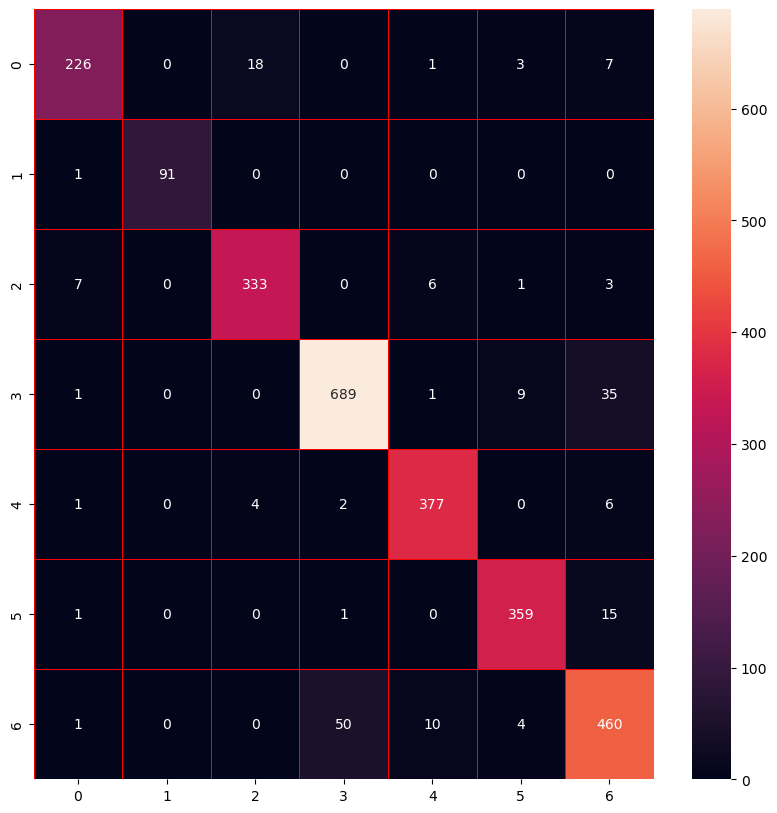

In [16]:
# Performance evaluation
accuracy1 = accuracy_score(y_test, y_pred)
precision1 = precision_score(y_test, y_pred,average='macro')
recall1 = recall_score(y_test, y_pred,average='macro')
f11 = f1_score(y_test, y_pred,average='macro')
report1 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(accuracy1))
print('Precision: {0:0.4f}'.format(precision1))
print('Recall: {0:0.4f}'.format(recall1))
print('F1 Score: {0:0.4f}'.format(f11))
print("Classification Report:\n", report1)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

Class 0 (Seker):
The model correctly predicted Seker beans 226 times.
It misclassified 0 Seker beans as Class 2 (Barbunya).
It misclassified 18 Seker beans as Class 3 (Bombay).
It misclassified 0 Seker beans as Class 4 (Cali).
It misclassified 1 Seker beans as Class 5 (Dermosan).
It misclassified 3 Seker beans as Class 6 (Horoz).
It misclassified 7 Seker beans as Class 7 (Sira).

Class 1 (Barbunya):
The model correctly predicted Barbunya beans 359 times.
It misclassified 1 Barbunya beans as Class 0 (Seker).
It misclassified 0 Barbunya beans as Class 3 (Bombay).
It misclassified 0 Barbunya beans as Class 4 (Cali).
It misclassified 0 Barbunya beans as Class 5 (Dermosan).
It misclassified 0 Barbunya beans as Class 6 (Horoz).
It misclassified 0 Seker beans as Class 7 (Sira).

Class 2 (Bombay):
The model correctly predicted Bombay beans 333 times.
It misclassified 7 Bombay beans as Class 0 (Seker).
It misclassified 0 Bombay beans as Class 1 (Barbunya).
It misclassified 0 Bombay beans as Class 3 (Cali).
It misclassified 6 Bombay beans as Class 5 (Dermosan).
It misclassified 1 Bombay beans as Class 6 (Horoz).
It misclassified 7 Seker beans as Class 7 (Sira).

Class 3 (Cali):
The model correctly predicted Cali beans 689 times.
It misclassified 1 Cali beans as Class 0 (Seker).
It misclassified 0 Cali beans as Class 1 (Barbunya).
It misclassified 0 Cali beans as Class 2 (Bombay).
It misclassified 1 Cali beans as Class 5 (Dermosan).
It misclassified 9 Cali beans as Class 6 (Horoz).
It misclassified 35 Seker beans as Class 7 (Sira).

Class 4 (Dermosan):
The model correctly predicted Dermosan beans 377 times.
It misclassified 1 Dermosan beans as Class 0 (Seker).
It misclassified 0 Dermosan beans as Class 1 (Barbunya).
It misclassified 4 Dermosan beans as Class 2 (Bombay).
It misclassified 2 Dermosan beans as Class 4 (Cali).
It misclassified 0 Dermosan beans as Class 6 (Horoz).
It misclassified 6 Seker beans as Class 7 (Sira).

Class 5 (Horoz) :
The model correctly predicted Horoz beans 359 times.
It misclassified 1 Horoz beans as Class 0 (Seker).
It misclassified 0 Horoz beans as Class 1 (Barbunya).
It misclassified 0 Horoz beans as Class 2 (Bombay).
It misclassified 1 Horoz beans as Class 4 (Cali).
It misclassified 0 Horoz beans as Class 5 (Dermosan).
It misclassified 15 Seker beans as Class 7 (Sira).

Class 6 (Sira):
The model correctly predicted Sira beans 460 times.
It misclassified 1 Sira beans as Class 0 (Seker).
It misclassified 0 Sira beans as Class 1 (Barbunya).
It misclassified 0 Sira beans as Class 2 (Bombay).
It misclassified 50 Sira beans as Class 4 (Cali).
It misclassified 10 Sira beans as Class 5 (Dermosan).
It misclassified 4 Dermosan beans as Class 6 (Horoz).

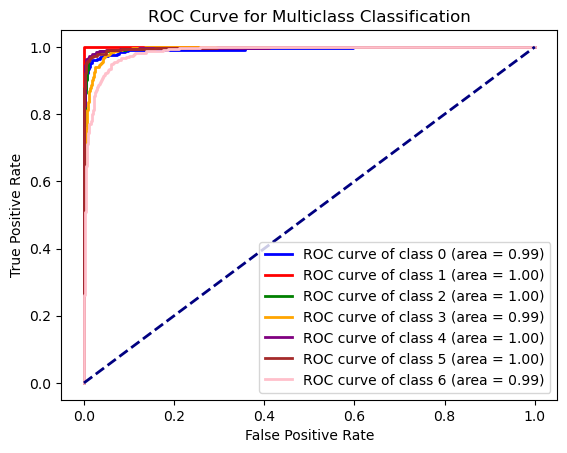

In [17]:
from sklearn.preprocessing import label_binarize

y_score = l1.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()


The x-axis represents the False Positive Rate (FPR), which is the proportion of negative instances incorrectly classified as positive.

The y-axis represents the True Positive Rate (TPR), also known as sensitivity or recall. It is the proportion of positive instances correctly classified as positive.

The top-left corner of the plot represents the ideal point: a TPR of 1 (perfectly identifying all positive instances) and an FPR of 0 (no false positives). Our curve is very close to this point indicating a good model.

Our model curves are also above the random classifier line ie its performance is better than random guessing. The AUC values are also closer to one indicating a good model

# C=100

In [18]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
l2 = SVC(kernel='linear',C=100,probability=True).fit(X_train, y_train)
y_pred2 = l2.predict(X_test)

Accuracy: 0.9339
Precision: 0.9458
Recall: 0.9413
F1 Score: 0.9434
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.92       255
           1       1.00      1.00      1.00        92
           2       0.94      0.95      0.94       350
           3       0.93      0.94      0.93       735
           4       0.97      0.96      0.97       390
           5       0.96      0.95      0.96       376
           6       0.88      0.88      0.88       525

    accuracy                           0.93      2723
   macro avg       0.95      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 640x480 with 0 Axes>

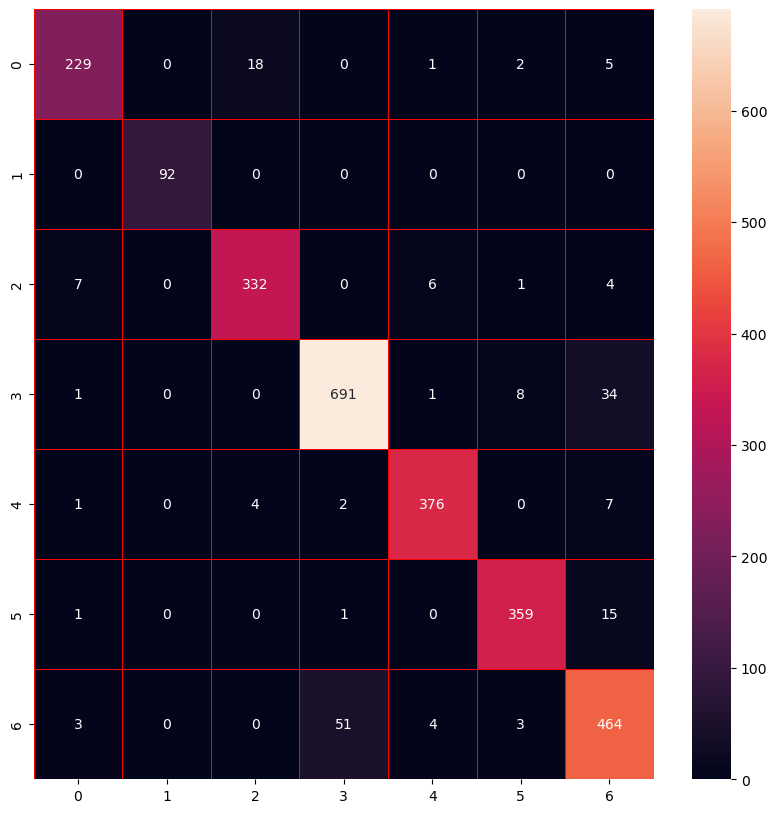

In [19]:
# Performance evaluation
accuracy2 = accuracy_score(y_test, y_pred2)
precision2 = precision_score(y_test, y_pred2,average='macro')
recall2 = recall_score(y_test, y_pred2,average='macro')
f12 = f1_score(y_test, y_pred2,average='macro')
report2 = classification_report(y_test, y_pred2)
m2 = confusion_matrix(y_test, y_pred2)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(accuracy2))
print('Precision: {0:0.4f}'.format(precision2))
print('Recall: {0:0.4f}'.format(recall2))
print('F1 Score: {0:0.4f}'.format(f12))
print("Classification Report:\n", report2)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m2, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

As discussed above the diagonal elements are True positives:

The model correctly predicted Seker beans 229 times.

The model correctly predicted Barbunya beans 92 times.

The model correctly predicted Bombay beans 332 times.

The model correctly predicted Cali beans 691 times.

The model correctly predicted Dermosan beans 376 times.

The model correctly predicted Horoz beans 359 times.

The model correctly predicted Sira beans 464 times.


The accuracy has increased with these parameters

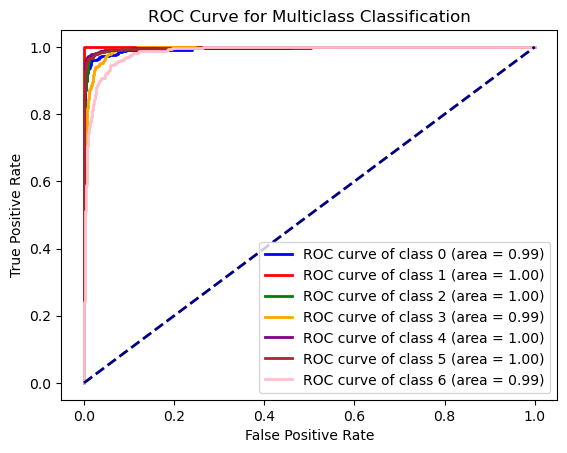

In [20]:
from sklearn.preprocessing import label_binarize

y_score = l2.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The majority of classes have excellent AUC values (close to 1.0), suggesting strong model performance. Some classes (like Class 4 and 5) have lower AUC values, indicating challenges in distinguishing them from other classes.

# C=1000

In [21]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
l3 = SVC(kernel='linear',C=1000,probability=True).fit(X_train, y_train)
y_pred3 = l3.predict(X_test)

Accuracy: 0.9332
Precision: 0.9447
Recall: 0.9404
F1 Score: 0.9425
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.89      0.92       255
           1       1.00      1.00      1.00        92
           2       0.94      0.95      0.95       350
           3       0.93      0.94      0.93       735
           4       0.97      0.96      0.96       390
           5       0.96      0.95      0.96       376
           6       0.87      0.89      0.88       525

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 640x480 with 0 Axes>

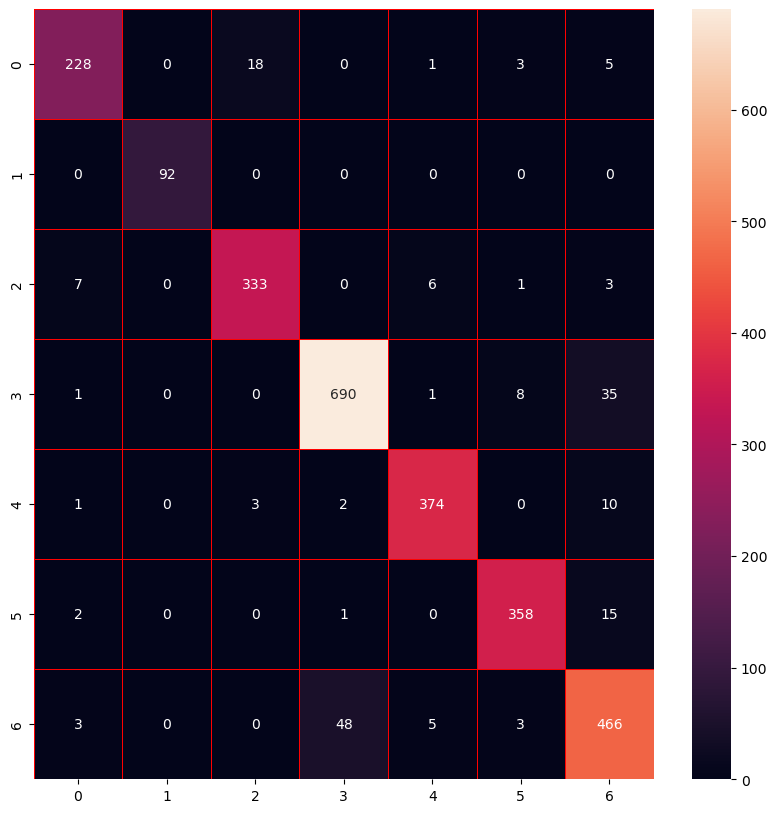

In [23]:
accuracy3 = accuracy_score(y_test, y_pred3)
precision3 = precision_score(y_test, y_pred3,average='macro')
recall3 = recall_score(y_test, y_pred3,average='macro')
f13 = f1_score(y_test, y_pred3,average='macro')
report3 = classification_report(y_test, y_pred3)
m3 = confusion_matrix(y_test, y_pred3)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(accuracy3))
print('Precision: {0:0.4f}'.format(precision3))
print('Recall: {0:0.4f}'.format(recall3))
print('F1 Score: {0:0.4f}'.format(f13))
print("Classification Report:\n", report3)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m3, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 228 times.

The model correctly predicted Barbunya beans 376 times.

The model correctly predicted Bombay beans 333 times.

The model correctly predicted Cali beans 359 times.

The model correctly predicted Dermosan beans 376 times.

The model correctly predicted Horoz beans 376 times.

The model correctly predicted Sira beans 464 times.

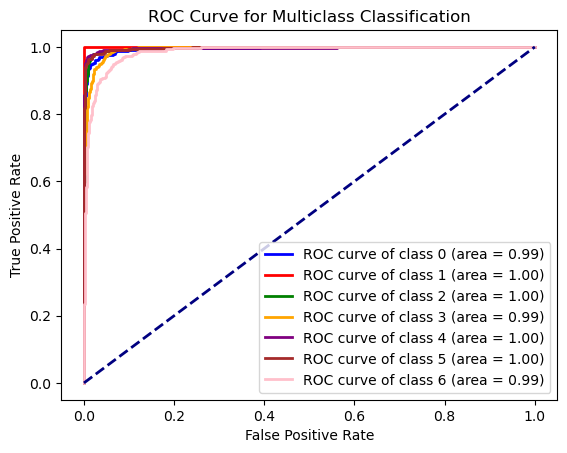

In [24]:
from sklearn.preprocessing import label_binarize

y_score = l3.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The majority of classes have excellent AUC values (close to 1.0), suggesting strong model performance. Some classes (like Class 4 and 5) have lower AUC values, indicating challenges in distinguishing them from other classes.

Compared to the previous model the accuracy of this model has decreased. Therefore we will not further increase C value and consider C=100 as our final linear kernal model.

# Polynomial Kernel

# degree=3, C=1

In [25]:
p1 = SVC(kernel='poly', degree=3, C=1.0,probability=True)
p1.fit(X_train, y_train)
y_pred = p1.predict(X_test)

Accuracy: 0.9130
Precision: 0.9370
Recall: 0.9183
F1 Score: 0.9257
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.81      0.88       255
           1       1.00      0.99      0.99        92
           2       0.95      0.91      0.93       350
           3       0.94      0.90      0.92       735
           4       0.97      0.95      0.96       390
           5       0.98      0.95      0.96       376
           6       0.76      0.91      0.83       525

    accuracy                           0.91      2723
   macro avg       0.94      0.92      0.93      2723
weighted avg       0.92      0.91      0.91      2723



<Figure size 640x480 with 0 Axes>

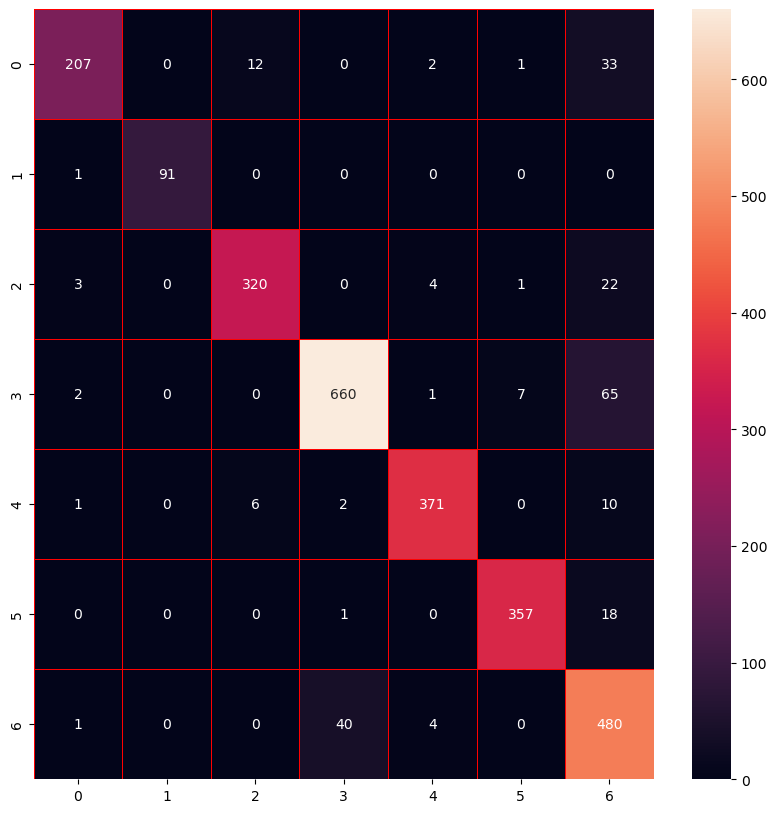

In [27]:
# Performance evaluation
paccuracy1 = accuracy_score(y_test, y_pred)
pprecision1 = precision_score(y_test, y_pred,average='macro')
precall1 = recall_score(y_test, y_pred,average='macro')
pf11 = f1_score(y_test, y_pred,average='macro')
preport1 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(paccuracy1))
print('Precision: {0:0.4f}'.format(pprecision1))
print('Recall: {0:0.4f}'.format(precall1))
print('F1 Score: {0:0.4f}'.format(pf11))
print("Classification Report:\n", preport1)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 207 times.

The model correctly predicted Barbunya beans 91 times.

The model correctly predicted Bombay beans 320 times.

The model correctly predicted Cali beans 660 times.

The model correctly predicted Dermosan beans 371 times.

The model correctly predicted Horoz beans 357 times.

The model correctly predicted Sira beans 480 times.

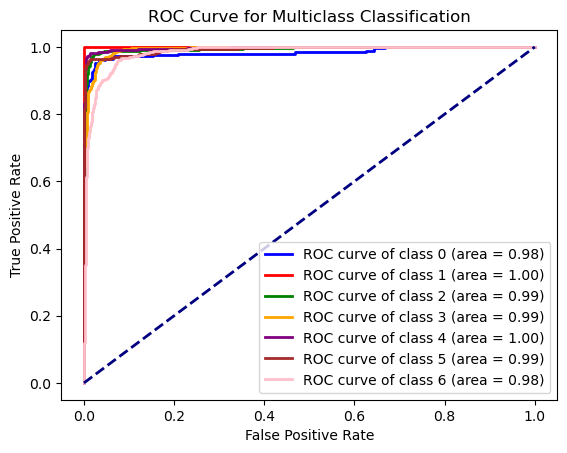

In [28]:
from sklearn.preprocessing import label_binarize

y_score = p1.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()


Each colored line corresponds to a different class (class 0 through class 6).
The AUC values for each class are good, ranging from 0.98 to 1.00. As these vales are closer to one, we can deduce that model performs exceptionally well in distinguishing between different classes

# degree 5, C=10

In [29]:
p2 = SVC(kernel='poly', degree=5, C=10.0,probability=True)
p2.fit(X_train, y_train)
y_pred = p2.predict(X_test)

Accuracy: 0.8990
Precision: 0.9257
Recall: 0.9024
F1 Score: 0.9103
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.75      0.83       255
           1       1.00      0.99      0.99        92
           2       0.93      0.88      0.90       350
           3       0.96      0.87      0.91       735
           4       0.98      0.93      0.95       390
           5       0.98      0.94      0.96       376
           6       0.72      0.95      0.82       525

    accuracy                           0.90      2723
   macro avg       0.93      0.90      0.91      2723
weighted avg       0.91      0.90      0.90      2723



<Figure size 640x480 with 0 Axes>

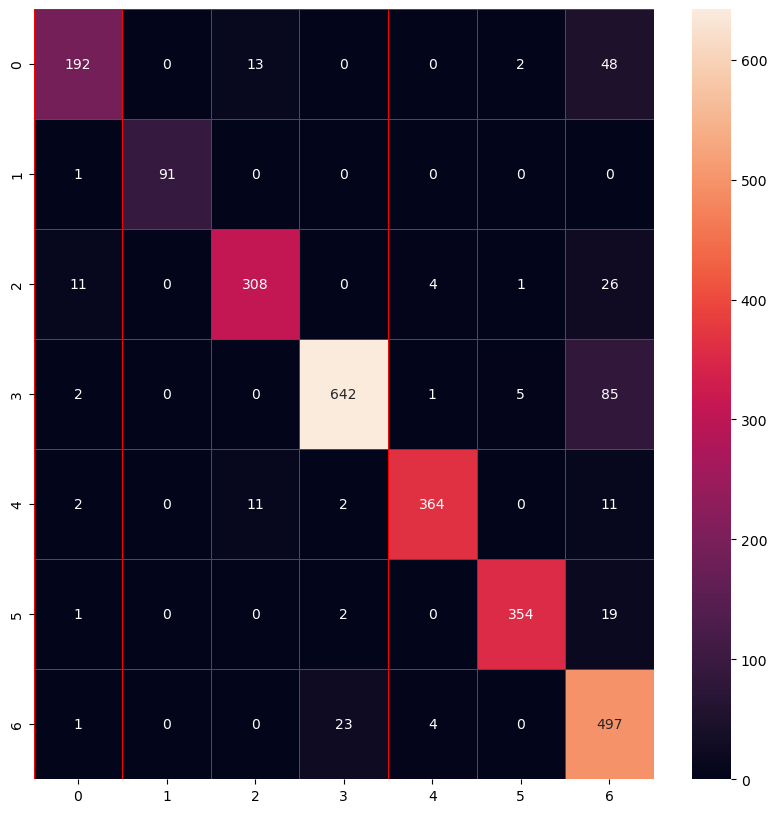

In [30]:
# Performance evaluation
paccuracy2 = accuracy_score(y_test, y_pred)
pprecision2 = precision_score(y_test, y_pred,average='macro')
precall2 = recall_score(y_test, y_pred,average='macro')
pf12 = f1_score(y_test, y_pred,average='macro')
preport2 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(paccuracy2))
print('Precision: {0:0.4f}'.format(pprecision2))
print('Recall: {0:0.4f}'.format(precall2))
print('F1 Score: {0:0.4f}'.format(pf12))
print("Classification Report:\n", preport2)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 192 times.

The model correctly predicted Barbunya beans 91 times.

The model correctly predicted Bombay beans 308 times.

The model correctly predicted Cali beans 642 times.

The model correctly predicted Dermosan beans 364 times.

The model correctly predicted Horoz beans 354 times.

The model correctly predicted Sira beans 497 times.

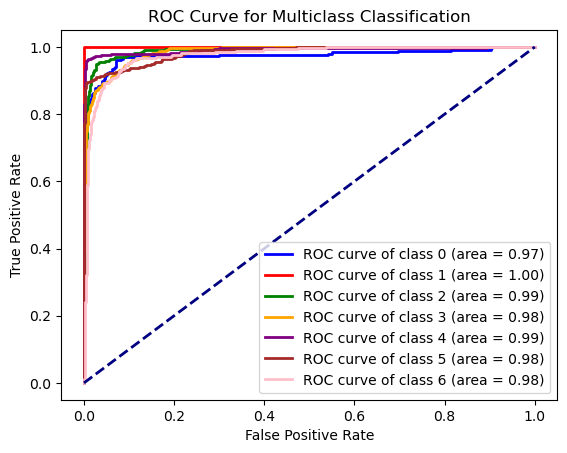

In [31]:
from sklearn.preprocessing import label_binarize

y_score = p2.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The auc values have dropped to 0.97 range indicating increased mispredictions

# degree =10 , C=100

In [32]:
p3 = SVC(kernel='poly', degree=10, C=100,probability=True)
p3.fit(X_train, y_train)
y_pred = p3.predict(X_test)

Accuracy: 0.8061
Precision: 0.8967
Recall: 0.8220
F1 Score: 0.8386
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.56      0.71       255
           1       1.00      1.00      1.00        92
           2       0.92      0.73      0.81       350
           3       0.90      0.68      0.77       735
           4       0.96      0.91      0.94       390
           5       0.98      0.90      0.93       376
           6       0.55      0.98      0.70       525

    accuracy                           0.81      2723
   macro avg       0.90      0.82      0.84      2723
weighted avg       0.86      0.81      0.81      2723



<Figure size 640x480 with 0 Axes>

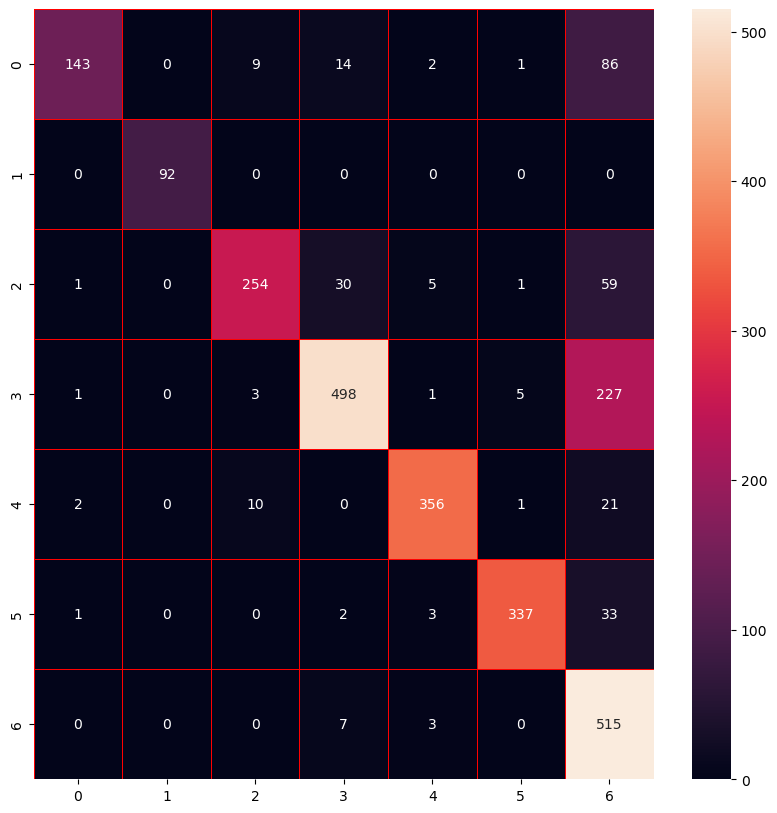

In [34]:
# Performance evaluation
paccuracy3 = accuracy_score(y_test, y_pred)
pprecision3 = precision_score(y_test, y_pred,average='macro')
precall3 = recall_score(y_test, y_pred,average='macro')
pf13 = f1_score(y_test, y_pred,average='macro')
preport3 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(paccuracy3))
print('Precision: {0:0.4f}'.format(pprecision3))
print('Recall: {0:0.4f}'.format(precall3))
print('F1 Score: {0:0.4f}'.format(pf13))
print("Classification Report:\n", preport3)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 143 times.

The model correctly predicted Barbunya beans 92 times.

The model correctly predicted Bombay beans 254 times.

The model correctly predicted Cali beans 498 times.

The model correctly predicted Dermosan beans 356 times.

The model correctly predicted Horoz beans 337 times.

The model correctly predicted Sira beans 515 times.

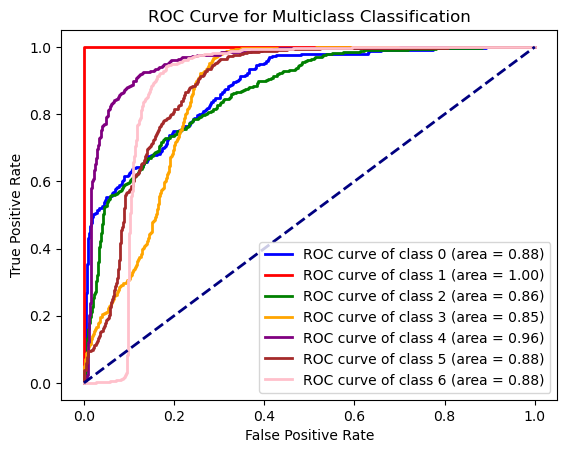

In [35]:
from sklearn.preprocessing import label_binarize

y_score = p3.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The accuracy has further dropped down to 80 percenct and the same is reflected in the graph. The auc values have decreased to 0.87 range. Therefore we will take degree=3, c=1 as the model for polynomial kernel as it has the best accurcay so far.

# RBF Kernel

# gamma=0.2,C=1

In [36]:
r1 = SVC(kernel='rbf', gamma=0.2, C=1,probability=True)
r1.fit(X_train, y_train)
y_pred = r1.predict(X_test)

Accuracy: 0.9372
Precision: 0.9502
Recall: 0.9444
F1 Score: 0.9471
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       255
           1       1.00      1.00      1.00        92
           2       0.94      0.96      0.95       350
           3       0.93      0.94      0.93       735
           4       0.97      0.97      0.97       390
           5       0.96      0.96      0.96       376
           6       0.88      0.89      0.88       525

    accuracy                           0.94      2723
   macro avg       0.95      0.94      0.95      2723
weighted avg       0.94      0.94      0.94      2723



<Figure size 640x480 with 0 Axes>

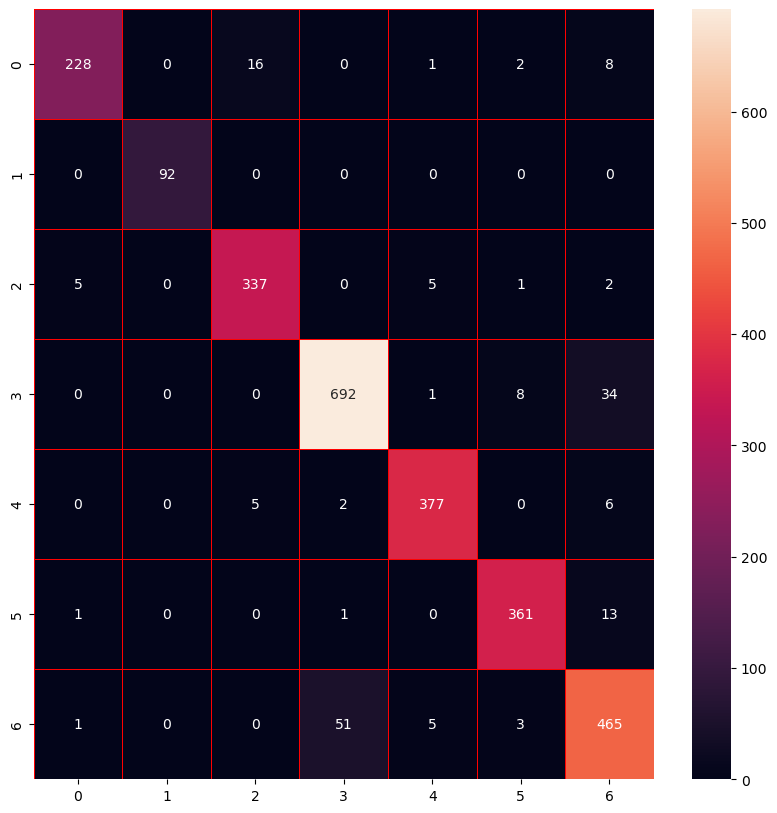

In [37]:
# Performance evaluation
raccuracy1 = accuracy_score(y_test, y_pred)
rprecision1 = precision_score(y_test, y_pred,average='macro')
rrecall1 = recall_score(y_test, y_pred,average='macro')
rf11 = f1_score(y_test, y_pred,average='macro')
rreport1 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(raccuracy1))
print('Precision: {0:0.4f}'.format(rprecision1))
print('Recall: {0:0.4f}'.format(rrecall1))
print('F1 Score: {0:0.4f}'.format(rf11))
print("Classification Report:\n", rreport1)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 228 times.

The model correctly predicted Barbunya beans 92 times.

The model correctly predicted Bombay beans 337 times.

The model correctly predicted Cali beans 692 times.

The model correctly predicted Dermosan beans 377 times.

The model correctly predicted Horoz beans 361 times.

The model correctly predicted Sira beans 465 times.

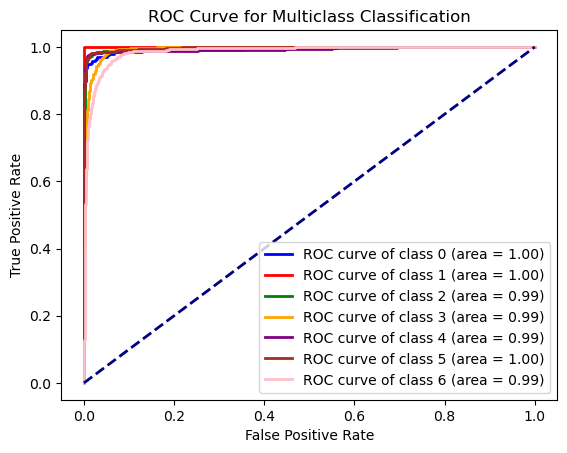

In [98]:
from sklearn.preprocessing import label_binarize

y_score = r1.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

Each colored line in the ROC curve corresponds to a different class (type of bean) and we can see that all classes have high AUC values which are 1 or closer to 1, suggesting excellent classification performance for all types of beans.

# gamma=0.5, C=10

In [38]:
r2 = SVC(kernel='rbf', gamma=0.5, C=10,probability=True)
r2.fit(X_train, y_train)
y_pred = r2.predict(X_test)

Accuracy: 0.9266
Precision: 0.9398
Recall: 0.9355
F1 Score: 0.9376
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       255
           1       1.00      0.99      0.99        92
           2       0.95      0.95      0.95       350
           3       0.92      0.93      0.92       735
           4       0.94      0.96      0.95       390
           5       0.95      0.96      0.96       376
           6       0.87      0.86      0.87       525

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 640x480 with 0 Axes>

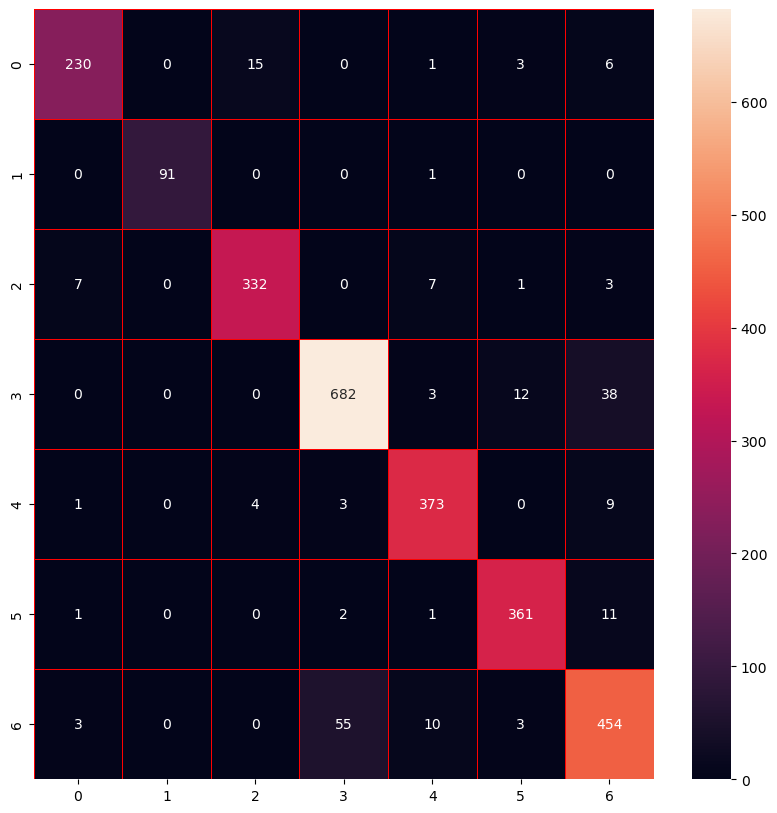

In [39]:
# Performance evaluation
raccuracy2 = accuracy_score(y_test, y_pred)
rprecision2 = precision_score(y_test, y_pred,average='macro')
rrecall2 = recall_score(y_test, y_pred,average='macro')
rf12 = f1_score(y_test, y_pred,average='macro')
rreport2 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(raccuracy2))
print('Precision: {0:0.4f}'.format(rprecision2))
print('Recall: {0:0.4f}'.format(rrecall2))
print('F1 Score: {0:0.4f}'.format(rf12))
print("Classification Report:\n", rreport2)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 230 times.

The model correctly predicted Barbunya beans 91 times.

The model correctly predicted Bombay beans 332 times.

The model correctly predicted Cali beans 682 times.

The model correctly predicted Dermosan beans 373 times.

The model correctly predicted Horoz beans 361 times.

The model correctly predicted Sira beans 454 times.

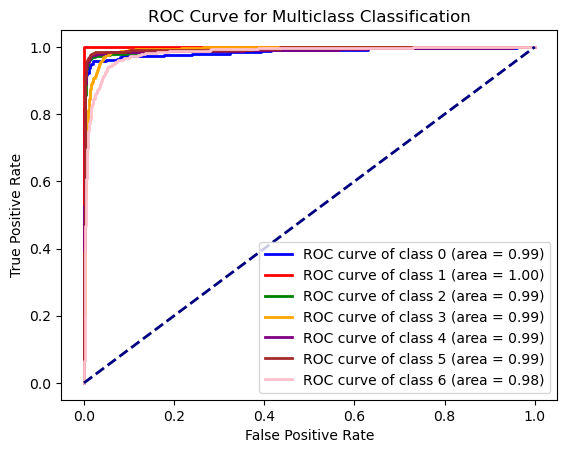

In [102]:
from sklearn.preprocessing import label_binarize

y_score = r2.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The accuarcy has dropped and the same is reflected in the graph as well. The auc values have dropped to 0.99

# gamma=0.1, C=100

In [40]:
r3 = SVC(kernel='rbf', gamma=0.1, C=100,probability=True)
r3.fit(X_train, y_train)
y_pred = r3.predict(X_test)

Accuracy: 0.9321
Precision: 0.9442
Recall: 0.9408
F1 Score: 0.9424
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       255
           1       1.00      1.00      1.00        92
           2       0.93      0.95      0.94       350
           3       0.92      0.93      0.93       735
           4       0.96      0.95      0.96       390
           5       0.95      0.96      0.96       376
           6       0.88      0.88      0.88       525

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 640x480 with 0 Axes>

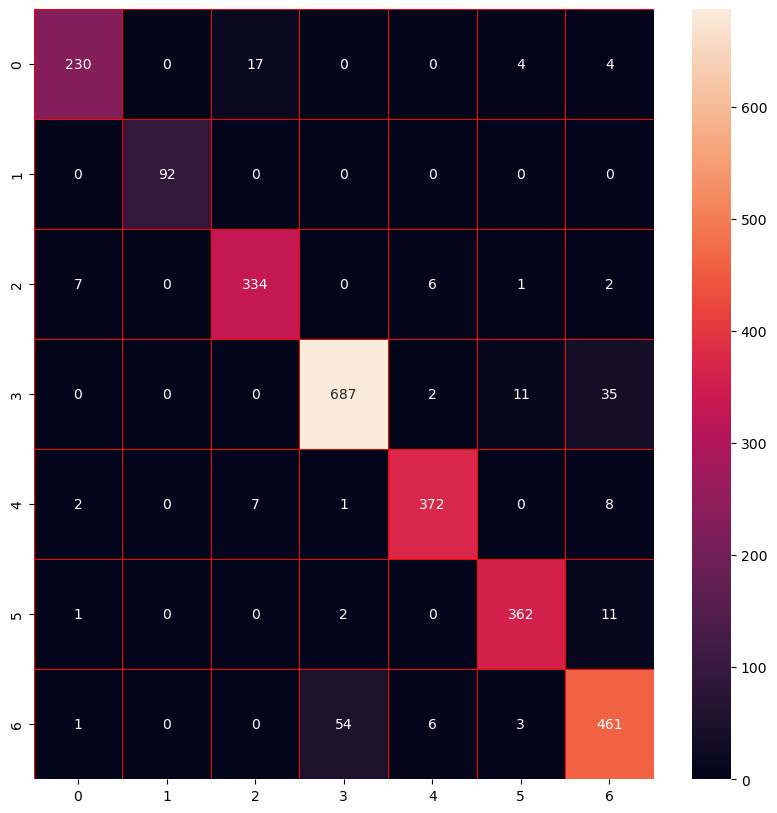

In [41]:
# Performance evaluation
raccuracy3 = accuracy_score(y_test, y_pred)
rprecision3 = precision_score(y_test, y_pred,average='macro')
rrecall3 = recall_score(y_test, y_pred,average='macro')
rf13 = f1_score(y_test, y_pred,average='macro')
rreport3 = classification_report(y_test, y_pred)
m1 = confusion_matrix(y_test, y_pred)
plt.savefig('ConfusionMatrix.png')
print('Accuracy: {0:0.4f}'.format(raccuracy3))
print('Precision: {0:0.4f}'.format(rprecision3))
print('Recall: {0:0.4f}'.format(rrecall3))
print('F1 Score: {0:0.4f}'.format(rf13))
print("Classification Report:\n", rreport3)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(m1, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()

The model correctly predicted Seker beans 230 times.

The model correctly predicted Barbunya beans 92 times.

The model correctly predicted Bombay beans 334 times.

The model correctly predicted Cali beans 687 times.

The model correctly predicted Dermosan beans 372 times.

The model correctly predicted Horoz beans 362 times.

The model correctly predicted Sira beans 461 times.

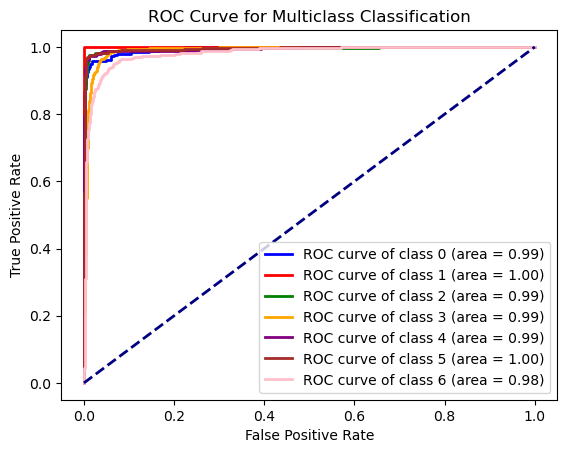

In [105]:
from sklearn.preprocessing import label_binarize

y_score = r3.predict_proba(X_test)
# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2, 3, 4, 5, 6])  

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(7):  
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink']  # Define colors for each class
for i, color in zip(range(7), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

The accuracy has further dropped leading to a decrease in auc values as well to 0.98. Thus we choose gamma=0.2,C=1 as our final model as it has the highes accuracy so far in RBF Models


# Result Analysis

## Binary class

In [146]:
import pandas as pd

# Define data
data = {
    'Model Name': ['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6', 'Model 7', 'Model 8'],
    'Kernel': ['Linear', 'Linear', 'Polynomial', 'Polynomial', 'Sigmoid', 'Sigmoid', 'RBF', 'RBF'],
    'Parameters': ['C=1','C=100','degree=3, C=1','degree=4, C=100','gamma=0.1, coeff0=0, C=1','gamma=0.5, coef0=0.3, C=100','gamma=0.1, C=1','gamma=0.5, C=300'],
    'Accuracy': [accuracy1, accuracy2, accuracy3, accuracy4, accuracy5, accuracy6, accuracy7, accuracy8],
    'Precision': [precision1, precision2, precision3, precision4, precision5, precision6, precision7, precision8],
    'Recall': [recall1, recall2, recall3, recall4, recall5, recall6, recall7, recall8],
    'F1 Score': [f11, f12, f13, f14, f15, f16, f17, f18]
}

# Create DataFrame
df1 = pd.DataFrame(data)

# Display DataFrame
print(df1)


  Model Name      Kernel                   Parameters  Accuracy  Precision  \
0    Model 1      Linear                          C=1  0.589615   0.500000   
1    Model 2      Linear                        C=100  0.587940   0.496503   
2    Model 3  Polynomial                degree=3, C=1  0.814070   0.894118   
3    Model 4  Polynomial              degree=4, C=100  0.901173   0.866142   
4    Model 5     Sigmoid     gamma=0.1, coeff0=0, C=1  0.525963   0.418803   
5    Model 6     Sigmoid  gamma=0.5, coef0=0.3, C=100  0.566164   0.471074   
6    Model 7         RBF               gamma=0.1, C=1  0.862647   0.865471   
7    Model 8         RBF             gamma=0.5, C=300  0.901173   0.878049   

     Recall  F1 Score  
0  0.297959  0.373402  
1  0.289796  0.365979  
2  0.620408  0.732530  
3  0.897959  0.881764  
4  0.400000  0.409186  
5  0.465306  0.468172  
6  0.787755  0.824786  
7  0.881633  0.879837  


# Multi class

In [42]:
import pandas as pd

# Define data
data = {
    'Model Name': ['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6', 'Model 7', 'Model 8','Model 9'],
    'Kernel': ['Linear', 'Linear','Linear', 'Polynomial', 'Polynomial', 'Polynomial', 'RBF', 'RBF', 'RBF'],
    'Parameters': ['C=1','C=100','C=1000','degree=3, C=1','degree=5, C=10','degree=10, C=100','gamma=0.2, C=1','gamma=0.5,C=10','gamma=0.1, C=100'],
    'Accuracy': [accuracy1, accuracy2, accuracy3, paccuracy1, paccuracy2, paccuracy3, raccuracy1, raccuracy2, raccuracy3],
    'Precision': [precision1, precision2, precision3, pprecision1, pprecision2, precision3, rprecision1, rprecision2, rprecision3],
    'Recall': [recall1, recall2, recall3, precall1, precall2, precall3, rrecall1, rrecall2, rrecall3],
    'F1 Score': [f11, f12, f13, pf11, pf12, pf13, rf11, rf12, rf13]
}

# Create DataFrame
df1 = pd.DataFrame(data)

# Display DataFrame
print(df1)

  Model Name      Kernel        Parameters  Accuracy  Precision    Recall  \
0    Model 1      Linear               C=1  0.930959   0.942846  0.937413   
1    Model 2      Linear             C=100  0.933896   0.945759  0.941349   
2    Model 3      Linear            C=1000  0.933162   0.944693  0.940435   
3    Model 4  Polynomial     degree=3, C=1  0.912964   0.937045  0.918311   
4    Model 5  Polynomial    degree=5, C=10  0.899008   0.925700  0.902433   
5    Model 6  Polynomial  degree=10, C=100  0.806096   0.944693  0.822014   
6    Model 7         RBF    gamma=0.2, C=1  0.937202   0.950238  0.944423   
7    Model 8         RBF    gamma=0.5,C=10  0.926552   0.939820  0.935547   
8    Model 9         RBF  gamma=0.1, C=100  0.932060   0.944200  0.940807   

   F1 Score  
0  0.939954  
1  0.943449  
2  0.942454  
3  0.925654  
4  0.910341  
5  0.838560  
6  0.947082  
7  0.937572  
8  0.942364  


# Conclusion
For Binary class: Based on the table, Model 4 (polynomial kernel, degree=4, C=100) and Model 8 (gaussian rbf kernel,degree=4, C=100)  show the highest accuracy and good performance metrics across all categories. However, Model 4 has a slightly F1 score, making it the best performing model among the ones tested.

For Multi class: From the table we can conclude that Model 2 (Linear , C=100) has the highest accuracy on the given dataset followed by Model 3 (Linear, C=1000) and Model 9 (RBF, gamma=0.1 and C=100).

# References
1. https://www.datacamp.com/tutorial/svm-classification-scikit-learn-python
2. https://www.kaggle.com/datasets/anashamoutni/students-employability-dataset
3. https://www.ritchieng.com/machine-learning-evaluate-classification-model/
4. https://www.kaggle.com/datasets/impapan/dry-beans-dataset
5. https://www.analyticsvidhya.com/blog/2021/05/multiclass-classification-using-svm/
6. https://towardsdatascience.com/multiclass-classification-with-support-vector-machines-svm-kernel-trick-kernel-functions-   f9d5377d6f02